# Load libraries

In [1]:
#Note: This notebook was run in the conda environment named "Jacob_Env1" (provided on GitHub)
#Note: Additional analysis on fibroblasts (FIB Origin subdivision in particular) is provided in 2023_Notebook-Fibroblasts_Part2

In [2]:
#You are currently looking at the notebook processing/plotting fibroblasts only
cell_type = 'Fib'

In [3]:
#Load the required packages
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

import os
import pandas as pd
import numpy as np
import sys
import seaborn as sbn
import scanpy as sc
import scvelo as scv
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import bbknn
from IPython.display import clear_output
from matplotlib.ticker import MaxNLocator
import csv

In [4]:
#Set paths
path = '/mnt/c/Users/User/Jacob-Et-Al'

In [5]:
#Load gene list required for cell cycle scoring
cell_cycle_genes_path = os.path.join(path,'Notebook-Input','regev_lab_cell_cycle_genes.txt')
cell_cycle_genes = [x.strip().title() for x in open(cell_cycle_genes_path)]

# Separate dataset for S-phase or G2M-phase associated genes
s_genes = [x for x in cell_cycle_genes[:43]]
g2m_genes = [x for x in cell_cycle_genes[43:]]

In [6]:
scv.logging.print_version()
sc.logging.print_header()

Running scvelo 0.2.2 (python 3.7.7) on 2023-04-06 15:01.
scanpy==1.4.6 anndata==0.7.4 umap==0.4.6 numpy==1.19.1 scipy==1.5.2 pandas==1.1.1 scikit-learn==0.23.2 statsmodels==0.12.0rc0 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.8.0


In [7]:
#Define function that can remove axis elements from subplots
#axes can be either an individual subplot, a list of individual subplots or mix of multiple subplots in a nested list.
def clean_axis(axes, remove_borders = True, remove_ticks = True, remove_axis_labels = True):
    axes = flatten_list(axes)
    print(axes)
    for ax in axes:
        if remove_borders:
            for loc in ['left','right','top','bottom']:
                ax.spines[loc].set_visible(False)
        if remove_ticks:
            for side in ['x','y']:
                ax.tick_params(
                    axis=side,  # changes apply to the x-axis
                    which='both',  # both major and minor ticks are affected
                    bottom=False,  # ticks along the bottom edge are off
                    top=False,  # ticks along the top edge are off
                    left=False,
                    labelbottom=False,
                    labelleft=False,
                    labeltop = False)
        if remove_axis_labels:
            ax.set_ylabel('')
            ax.set_xlabel('')

#Define function to generate a plot with multiple subplots
def initialize_subplots(groups_to_plot, ncols = 3, figsize_multiplier = (7,5), gridspec_kw = None, figsize = None, print_help = True, **fig_kw):
    if type(groups_to_plot)==list:
        total = len(groups_to_plot)
    else:
        total = groups_to_plot
    nrows = int(np.ceil(total/ncols))
    if not figsize:
        figsize = (figsize_multiplier[0]*ncols, figsize_multiplier[1]*nrows)
    fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize = figsize, gridspec_kw = gridspec_kw, **fig_kw)
    if print_help:
        if nrows>1 and ncols>1:
            print('ax = axes[ix // ncols, ix % ncols]')
        else:
            print('ax = axes[ix]')
    return fig, axes

#Define function to make a flat, iteratable list out of a single element or a nested list
def flatten_list(lst):
    if type(lst)==np.ndarray:
        lst = lst.tolist()
    
    if type(lst)!=list:
        lst = [lst]
    elif len(lst)==1:
        lst = lst[0]
    elif not all([type(l)==list for l in lst]):
        lst = [[l] if type(l)!=list else l for l in lst]
        lst = [l for sublist in lst for l in sublist]
    else:
        lst = [l for sublist in lst for l in sublist]        
    return lst

# Import data

In [8]:
#Import scaled expression data which was generated with Seurat in R
adata = sc.read_csv(os.path.join(path, 'Notebook-Input','{}_ScaledData.csv'.format(cell_type))).transpose()

In [9]:
adata

AnnData object with n_obs × n_vars = 25974 × 20001

## Import metadata

In [10]:
#Import additional metadata (preprocessing was done with Seurat in R)
metadata = pd.read_csv(os.path.join(path, 'Notebook-Input', '{}_MetaData.csv'.format(cell_type)), index_col = 0)
HVGs = pd.read_csv(os.path.join(path, 'Notebook-Input', '{}_ListHVG.csv'.format(cell_type)), sep = ';', index_col = 0) 

## Assign metadata

In [11]:
#Add metadata to Scanpy's adata object
adata.obs = metadata.loc[adata.obs_names]

In [12]:
#Reuse highly variable genes which were determined with Seurat in R
adata.var['highly_variable'] = [True if x in HVGs.index else False for x in adata.var_names]

In [13]:
# Change all 'HC' columns (hierarchical clustering) to categorical for better plotting results
for col in [x for x in adata.obs.columns if 'HC' in x]:
    adata.obs[col] = adata.obs[col].astype('category')

In [14]:
#Original adata object has 25974 cells and 20001 genes
adata

AnnData object with n_obs × n_vars = 25974 × 20001
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'simp_index', 'invsimp_index', 'shan_index', 'perc_rpl', 'perc_rps', 'perc_hb.ab.', 'perc_mito', 'perc_hba', 'perc_hbb', 'perc_hist', 'filtered', 'sample_id', 'embryonic_age', 'genotype', 'dataset', 'sample_no', 'sample_code', 'sample_date', 'library', 'sequencing', 'sex', 'S.Score', 'G2M.Score', 'Phase', 'G1.Score', 'CC.Diff', 'HC_1', 'HC_2', 'HC_3', 'HC_4', 'HC_5', 'HC_6', 'HC_7', 'HC_8', 'HC_9', 'HC_10', 'HC_11', 'HC_12', 'HC_13', 'HC_14', 'HC_15', 'HC_16', 'HC_17', 'HC_18', 'HC_19', 'HC_20', 'HC_21', 'HC_22', 'HC_23', 'HC_24', 'HC_25', 'HC_26', 'HC_27', 'HC_28', 'HC_30', 'HC_31', 'HC_33', 'HC_35', 'HC_37', 'HC_39', 'HC_42', 'HC_45', 'HC_49', 'HC_53', 'HC_58', 'HC_64', 'HC_72', 'HC_82', 'HC_95', 'HC_112', 'HC_138', 'HC_180', 'HC_29', 'HC_40', 'HC_44', 'HC_47', 'HC_52', 'HC_73', 'HC_85', 'HC_101', 'HC_124', 'HC_161'
    var: 'highly_variable'

## Correct gene names from old to approved version (scaled data)

In [15]:
symbol_names = pd.read_csv(os.path.join(path, 'Notebook-Input','Hgnc-symbol-check.csv'), header = 1, index_col = 0)['Approved symbol'].dropna()
symbol_names.loc[symbol_names.index[symbol_names.index.duplicated()]]

Input
Lnp         NUSAP1
Lnp           LNPK
Csrp2bp      KAT14
Csrp2bp     PET117
Agpat9      LPCAT1
Agpat9       GPAT3
Stra13       CENPX
Stra13     BHLHE40
PISD          PISD
PISD          SFI1
Name: Approved symbol, dtype: object

In [16]:
# Some genes had multiple corresponding new approved names in HUGO,thu we decided to remove the duplicated genes from adata
duplicated_genes = symbol_names.index[symbol_names.index.duplicated()]
adata = adata[:, [x for x in adata.var_names if x not in duplicated_genes]].copy()

In [17]:
# The number of total genes reduced from 20001 to 19996
adata

AnnData object with n_obs × n_vars = 25974 × 19996
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'simp_index', 'invsimp_index', 'shan_index', 'perc_rpl', 'perc_rps', 'perc_hb.ab.', 'perc_mito', 'perc_hba', 'perc_hbb', 'perc_hist', 'filtered', 'sample_id', 'embryonic_age', 'genotype', 'dataset', 'sample_no', 'sample_code', 'sample_date', 'library', 'sequencing', 'sex', 'S.Score', 'G2M.Score', 'Phase', 'G1.Score', 'CC.Diff', 'HC_1', 'HC_2', 'HC_3', 'HC_4', 'HC_5', 'HC_6', 'HC_7', 'HC_8', 'HC_9', 'HC_10', 'HC_11', 'HC_12', 'HC_13', 'HC_14', 'HC_15', 'HC_16', 'HC_17', 'HC_18', 'HC_19', 'HC_20', 'HC_21', 'HC_22', 'HC_23', 'HC_24', 'HC_25', 'HC_26', 'HC_27', 'HC_28', 'HC_30', 'HC_31', 'HC_33', 'HC_35', 'HC_37', 'HC_39', 'HC_42', 'HC_45', 'HC_49', 'HC_53', 'HC_58', 'HC_64', 'HC_72', 'HC_82', 'HC_95', 'HC_112', 'HC_138', 'HC_180', 'HC_29', 'HC_40', 'HC_44', 'HC_47', 'HC_52', 'HC_73', 'HC_85', 'HC_101', 'HC_124', 'HC_161'
    var: 'highly_variable'

In [18]:
# Replace gene names with the approved symbols
adata.var_names = [symbol_names.loc[x].capitalize() if x in symbol_names.index else x for x in adata.var_names]

In [19]:
#After renaming one gene name was not unique anymore ('Ric8b'; old name 'Ric8'). The gene was removed.
adata.var_names[adata.var.index.duplicated()]
adata = adata[:, [True if x!='Ric8b' else False for x in adata.var_names]].copy()

# Read in raw and normalized data to add to layers

In [20]:
raw_data = sc.read_csv(os.path.join(path, 'Notebook-Input','{}_RawData.csv'.format(cell_type))).transpose()
norm_data = sc.read_csv(os.path.join(path, 'Notebook-Input','{}_NormalizedData.csv'.format(cell_type))).transpose()

In [21]:
raw_data

AnnData object with n_obs × n_vars = 25974 × 20001

## Correct gene names from old to approved version (raw and normalized data)

In [22]:
raw_data = raw_data[:, [x for x in raw_data.var_names if x not in duplicated_genes]].copy()
norm_data = norm_data[:, [x for x in norm_data.var_names if x not in duplicated_genes]].copy()

In [23]:
# Replace gene names with the approved symbols
raw_data.var_names = [symbol_names.loc[x].capitalize() if x in symbol_names.index else x for x in raw_data.var_names]
norm_data.var_names = [symbol_names.loc[x].capitalize() if x in symbol_names.index else x for x in norm_data.var_names]

In [24]:
# Remove 'Ric8b' gene from adata because it was duplicated (old name 'Ric8')
raw_data = raw_data[:, [True if x!='Ric8b' else False for x in raw_data.var_names]].copy()
norm_data = norm_data[:, [True if x!='Ric8b' else False for x in norm_data.var_names]].copy()

## Assign raw and normalized data as layers in adata

In [25]:
adata.layers['raw'] = raw_data[adata.obs_names][:,adata.var_names].X
adata.layers['normalized'] = norm_data[adata.obs_names][:,adata.var_names].X

In [26]:
adata.layers

Layers with keys: raw, normalized

# Dimensionality Reduction

## Run dimensionality reduction on original adata object

... storing 'orig.ident' as categorical
... storing 'sample_id' as categorical
... storing 'embryonic_age' as categorical
... storing 'genotype' as categorical
... storing 'dataset' as categorical
... storing 'sample_code' as categorical
... storing 'sample_date' as categorical
... storing 'library' as categorical
... storing 'sequencing' as categorical
... storing 'sex' as categorical
... storing 'Phase' as categorical


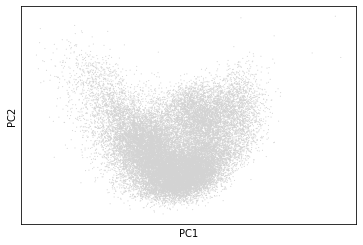

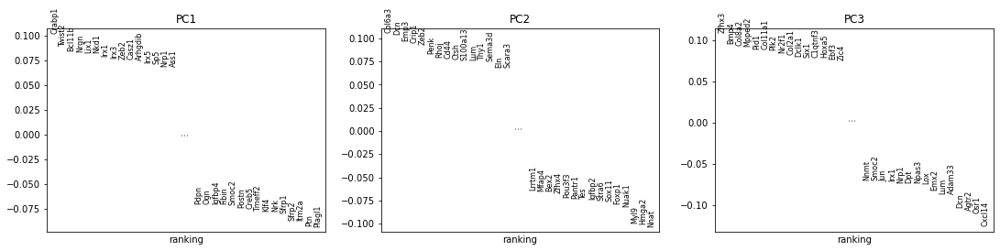

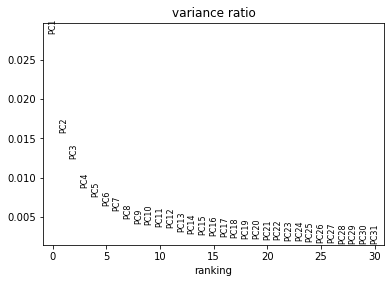

In [27]:
#Run PCA on scaled data from Seurat
sc.pp.pca(adata)
sc.pl.pca_overview(adata)

In [28]:
#Correct for batch effect from sampling date with the help of BBKNN
bbknn.bbknn(adata, batch_key = 'sample_date')

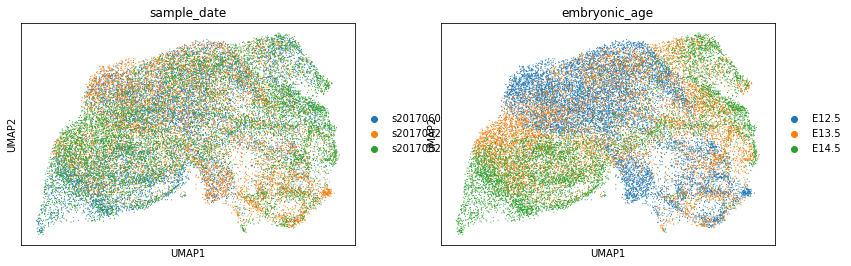

In [29]:
#Run UMAP and plot metadata from Seurat onto UMAP
#Note: Additional metadata is available (e.g. read counts, percentage of mitochondrial reads, etc.). Check adata.obs
sc.tl.umap(adata)
sc.pl.umap(adata, color = ['sample_date', 'embryonic_age'])

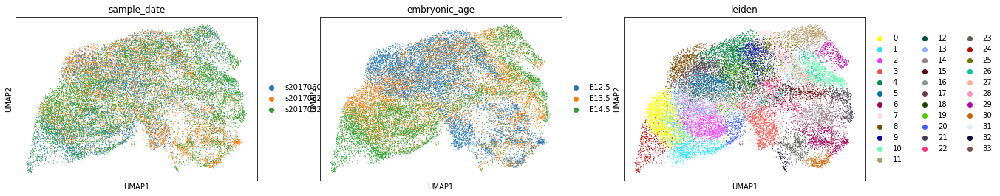

In [30]:
#Run Scanpy's leiden clustering function (rather than using pre-computed clustering results as they better capture the large diversity among the fibroblast cell cloud)
sc.tl.leiden(adata,resolution=1.7)
sc.pl.umap(adata, color = ['sample_date', 'embryonic_age','leiden'])

##  Identification and removel of pericyte/fibroblast doublets

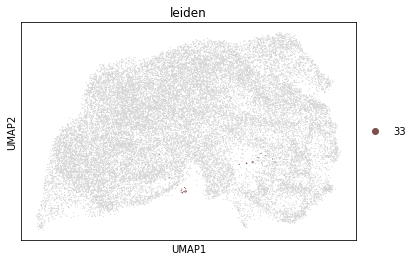

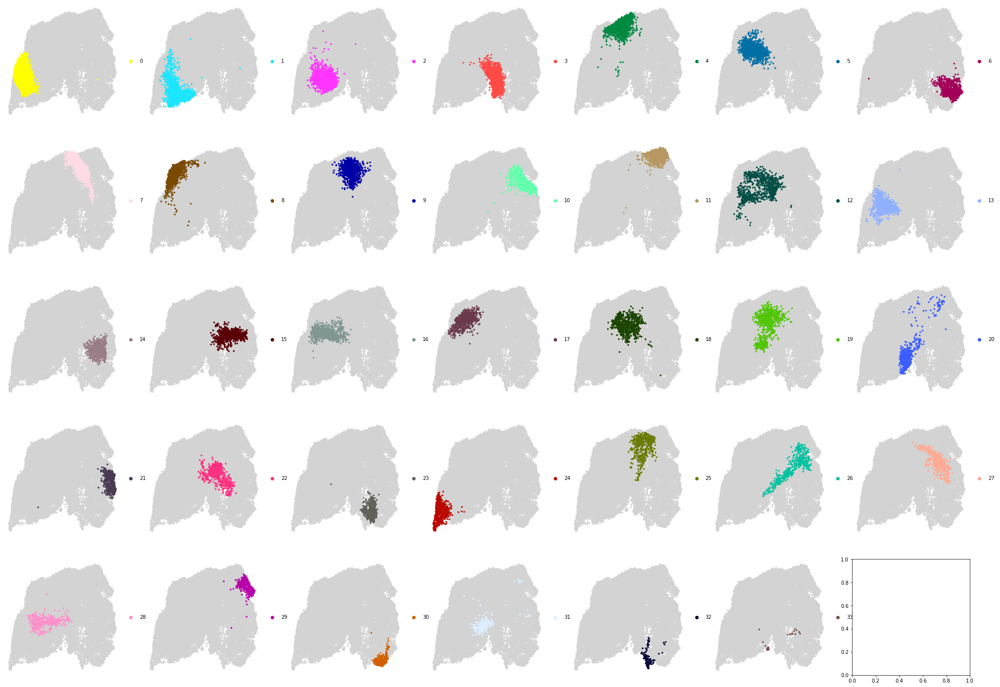

In [31]:
# Cluster 33 stands out through its isolated location in the UMAP
sc.pl.umap(adata, color = 'leiden', groups=['33'])

groups = adata.obs['leiden'].cat.categories
ncols = 7
nrows = int(np.ceil(len(groups)/ncols))
fig, axes = plt.subplots(ncols = ncols, nrows = nrows, figsize = (ncols*5, nrows*5))

for ix, group in enumerate(groups):
    ax = axes[ix // ncols, ix % ncols]
    sc.pl.umap(adata, color = 'leiden', groups = group, ax = ax, show = False, frameon = False, title = '', s = 50)

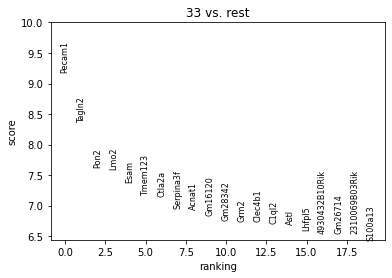

In [32]:
#Identify marker genes of cluster 33
sc.tl.rank_genes_groups(adata, groupby='leiden', groups = ['33'])
sc.pl.rank_genes_groups(adata)

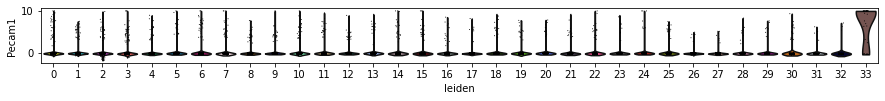

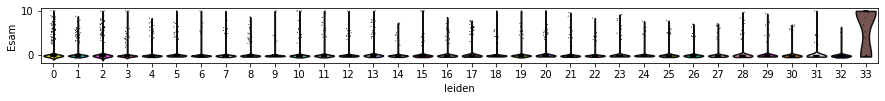

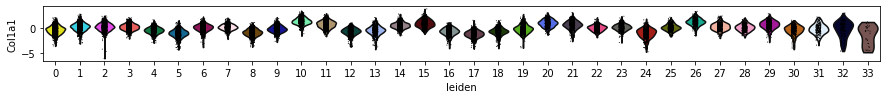

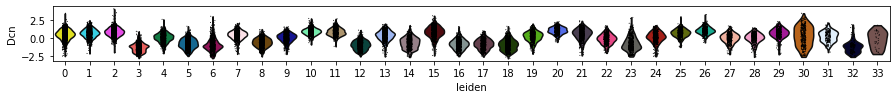

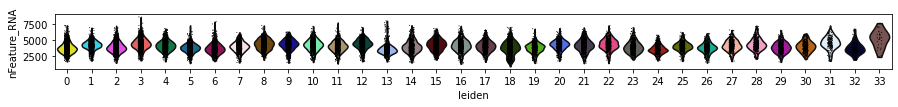

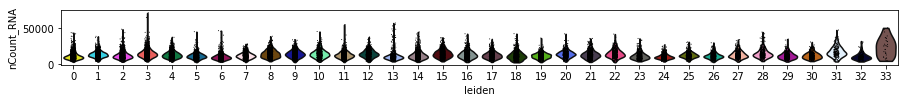

In [33]:
#Leiden cluster 33 cells have a fibroblast and vascular signature. Likely these are pericyte/fibroblast doublets.
genes = ['Pecam1','Esam','Col1a1','Dcn','nFeature_RNA','nCount_RNA']
for gene in genes:
    fig, ax = plt.subplots(figsize = (15, 1))
    sc.pl.violin(adata, keys = gene, groupby = 'leiden', ax = ax, cut = 0)

In [34]:
#A list of pericyte/Fibroblast doublet cells is saved as csv to allow removing those cells also in the analysis of the major cell types.
#Using csv.writer method from CSV package 
import csv
with open(os.path.join(path, 'Notebook-Output', 'Excluded-Doublets-2.csv'), 'w') as f: 
    write = csv.writer(f) 
    write.writerow(list(adata.obs_names[adata.obs['leiden'].isin(['33'])]))

In [35]:
#Pericyte/Fibroblast doublet cells are removed before continuing with further analysis.
adata = adata[~adata.obs['leiden'].isin(['33'])].copy()

In [36]:
#Cleaned adata object has 25944 cells and 19994 genes
adata

AnnData object with n_obs × n_vars = 25944 × 19994
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'simp_index', 'invsimp_index', 'shan_index', 'perc_rpl', 'perc_rps', 'perc_hb.ab.', 'perc_mito', 'perc_hba', 'perc_hbb', 'perc_hist', 'filtered', 'sample_id', 'embryonic_age', 'genotype', 'dataset', 'sample_no', 'sample_code', 'sample_date', 'library', 'sequencing', 'sex', 'S.Score', 'G2M.Score', 'Phase', 'G1.Score', 'CC.Diff', 'HC_1', 'HC_2', 'HC_3', 'HC_4', 'HC_5', 'HC_6', 'HC_7', 'HC_8', 'HC_9', 'HC_10', 'HC_11', 'HC_12', 'HC_13', 'HC_14', 'HC_15', 'HC_16', 'HC_17', 'HC_18', 'HC_19', 'HC_20', 'HC_21', 'HC_22', 'HC_23', 'HC_24', 'HC_25', 'HC_26', 'HC_27', 'HC_28', 'HC_30', 'HC_31', 'HC_33', 'HC_35', 'HC_37', 'HC_39', 'HC_42', 'HC_45', 'HC_49', 'HC_53', 'HC_58', 'HC_64', 'HC_72', 'HC_82', 'HC_95', 'HC_112', 'HC_138', 'HC_180', 'HC_29', 'HC_40', 'HC_44', 'HC_47', 'HC_52', 'HC_73', 'HC_85', 'HC_101', 'HC_124', 'HC_161', 'leiden'
    var: 'highly_variable'
    uns: 'pca', 'neighbors', 

## Rerun dimensionality reduction on cleaned adata object

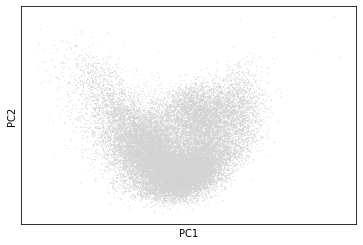

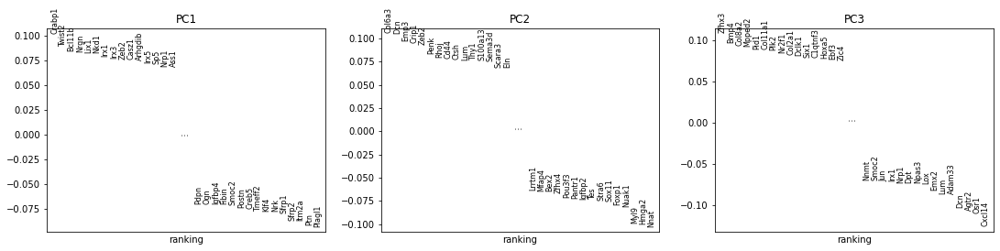

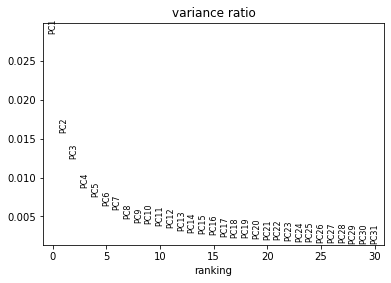

In [37]:
#Run PCA on cleaned adata object
sc.pp.pca(adata)
sc.pl.pca_overview(adata)

In [38]:
#Correct for batch effect from sampling date with the help of BBKNN
bbknn.bbknn(adata, batch_key = 'sample_date')

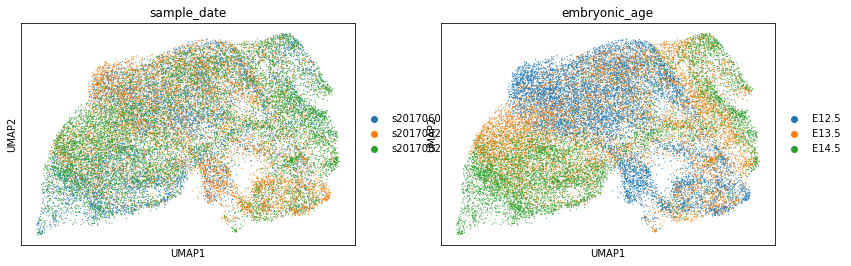

In [39]:
#Run UMAP and plot metadata from Seurat onto UMAP
sc.tl.umap(adata)
sc.pl.umap(adata, color = ['sample_date', 'embryonic_age'])

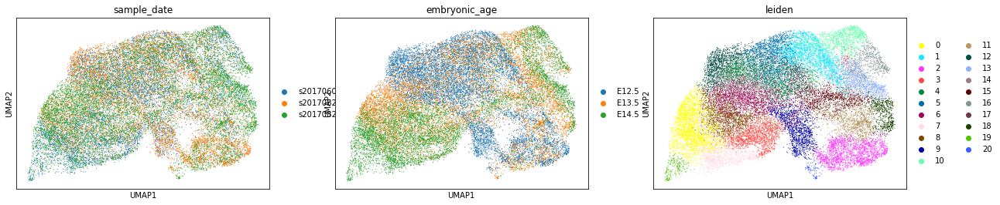

In [40]:
#Run Scanpy's leiden clustering function (rather than using pre-computed clustering results)
sc.tl.leiden(adata,resolution=1)
sc.pl.umap(adata, color = ['sample_date', 'embryonic_age','leiden'])

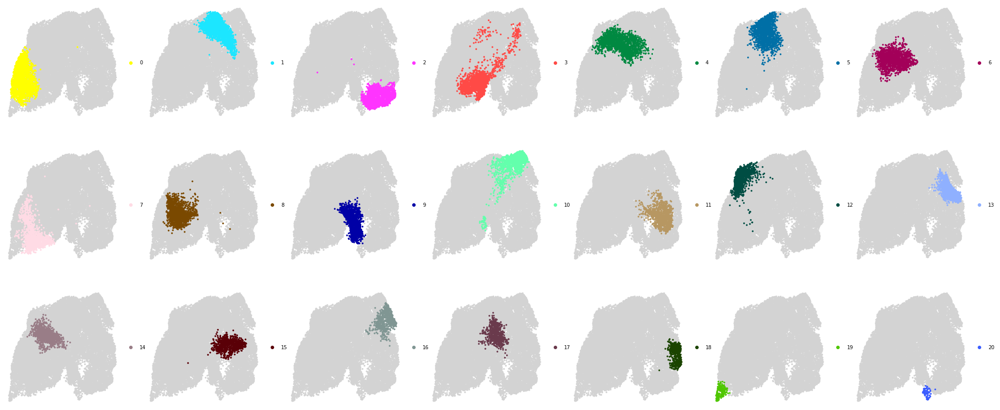

In [41]:
#Display location of each of the clusters
groups = adata.obs['leiden'].cat.categories
ncols = 7
nrows = int(np.ceil(len(groups)/ncols))
fig, axes = plt.subplots(ncols = ncols, nrows = nrows, figsize = (ncols*5, nrows*5))

for ix, group in enumerate(groups):
    ax = axes[ix // ncols, ix % ncols]
    sc.pl.umap(adata, color = 'leiden', groups = group, ax = ax, show = False, frameon = False, title = '', s = 50)

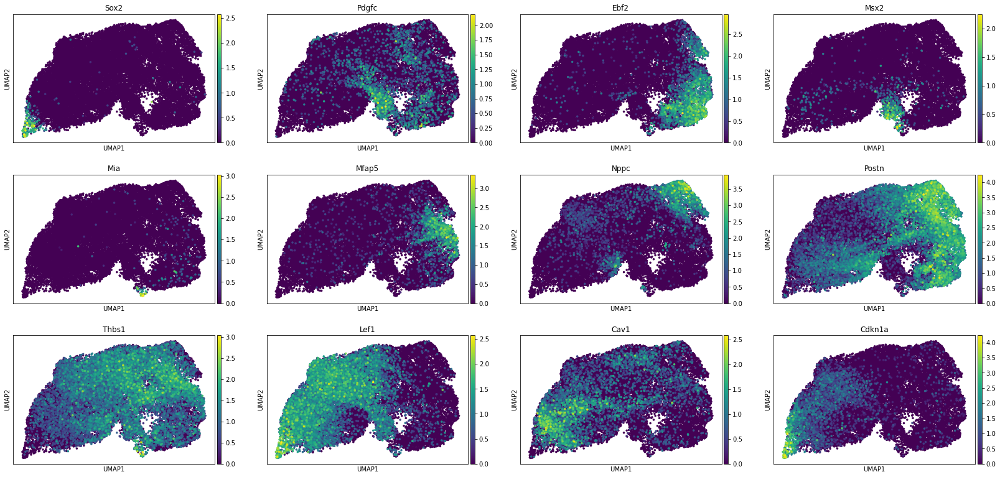

In [42]:
#Expression plots for a small selection of marker genes to orient within the fibroblast UMAP and assign some initial identities to the cluster 
#Note: Many different marker genes were used to uncover the identity of the different fibroblast subclusters (many more than shown here; see publication)
sc.pl.umap(adata, color =['Sox2','Pdgfc','Ebf2','Msx2','Mia','Mfap5','Nppc','Postn','Thbs1','Lef1','Cav1','Cdkn1a'], layer='normalized', s = 50)

## Save UMAP coordinates

In [43]:
pd.DataFrame(data = adata.obsm['X_umap'], index = adata.obs_names).to_csv(os.path.join(path, 'Notebook-Output', 'FIB_Umap-coordinates.csv'))

## Further subclustering of dermal condensate cells

In [44]:
#Make the leiden clustering results a categorical variable
adata.obs['leiden'] = adata.obs['leiden'].astype('category')

In [45]:
#Generate new adata object only containing dermal condensate (DC) cells to further subcluster them (we had observed that several marker genes such as Grin2a or Dll1 had a non-uniform expression across the DC cluster suggesting further sub-division)
adata_dc = adata[adata.obs['leiden'].isin(['19'])].copy()

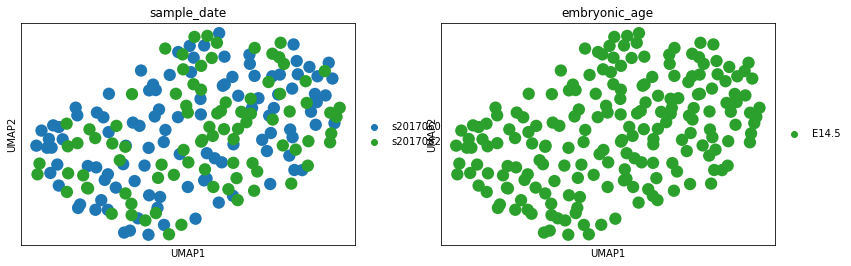

In [46]:
#Process the newly generated adata object containing DC cells only
sc.pp.pca(adata_dc)
bbknn.bbknn(adata_dc, batch_key = 'sample_date')
sc.tl.umap(adata_dc)
sc.pl.umap(adata_dc, color = ['sample_date', 'embryonic_age'])

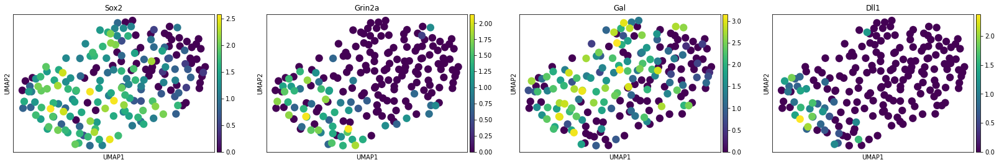

In [47]:
#Expression pattern of a handful of DC marker genes
sc.pl.umap(adata_dc, color =['Sox2','Grin2a','Gal','Dll1'], layer='normalized')

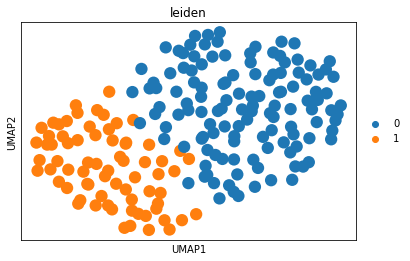

In [48]:
#Subcluster DC cells using leiden clustering
sc.tl.leiden(adata_dc,resolution=0.3)
sc.pl.umap(adata_dc, color='leiden')

In [49]:
#Make the leiden clustering results a categorical variable
adata_dc.obs['leiden'] = adata_dc.obs['leiden'].astype('category')

In [50]:
#Assign names to fibroblast subclusters
naming_dict = {'14':'FIB Origin1','4':'FIB Origin3','5':'FIB Origin4','17':'FIB Origin5','1':'FIB Origin6',
              '6': 'FIB Upper1','12':'FIB Origin2','8':'FIB Upper2','0':'FIB Upper3','7':'FIB Upper4', '19':'FIB DC',
              '3': 'FIB Lower',
              '9': 'FIB Deep1','11':'FIB Deep2','2':'FIB Deep3','20':'CHOND',
             '15':'FIB Inter1','13':'FIB Inter2','18':'FIB Inter3',
              '10':'FIB Muscle1','16':'FIB Muscle2'}
adata.obs['leiden_named'] = [naming_dict[x] for x in adata.obs['leiden']]
adata.obs['leiden_named'] = adata.obs['leiden_named'].astype('category')

In [51]:
#Replace "FIB DC" with DC subclustering information
cl_map = {'0': 'FIB EarlyDC', '1':'FIB LateDC'}
adata.obs['leiden_named_DCsub'] = [cl_map[adata_dc.obs['leiden'][umi]] if cl == 'FIB DC' else cl for umi, cl in adata.obs['leiden_named'].items()]
adata.obs['leiden_named_DCsub'] = adata.obs['leiden_named_DCsub'].astype('category')

In [52]:
cmap = {'FIB Origin1': '#666565',
        'FIB Origin2': '#336666',
        'FIB Origin3': '#070707',    
        'FIB Origin4': '#B2BCAF',
        'FIB Origin5': '#8FA3CC',
        'FIB Origin6': '#333B5B',
        'FIB Upper1': '#FABAA2',
        'FIB Upper2': '#F86B51',
        'FIB Upper3': '#C12489',
        'FIB Upper4': '#CE73E0',
        'FIB EarlyDC': '#A68CCE',
        'FIB LateDC': '#37156B',
        'FIB Inter1': '#32B6EA',
        'FIB Inter2': '#1978E0',
        'FIB Inter3': '#253EF2',
        'FIB Lower': '#FCC25A',
        'FIB Deep1': '#9D7866',
        'FIB Deep2': '#DD8129',
        'FIB Deep3': '#7D3B12',
        'CHOND': '#77C279',
        'FIB Muscle1': '#02441C',
        'FIB Muscle2': '#149914'}

adata.uns['leiden_named_DCsub_colors'] = [cmap[x] for x in adata.obs['leiden_named_DCsub'].cat.categories]

## Save fibroblast subclustering results

In [53]:
cluster_df = pd.DataFrame()
cluster_df['leiden_named_DCsub'] = adata.obs['leiden_named_DCsub']
cluster_df.to_csv(os.path.join(path, 'Notebook-Output', 'FIB_2nd-level-clustering.txt'))

# Velocity analysis

## Remove chondrocytes for velocity analysis

In [54]:
adata_nochond = adata[~adata.obs['leiden_named'].isin(['CHOND'])].copy()
adata_nochond
#adata object contains 25856 cells and 19994 genes

AnnData object with n_obs × n_vars = 25856 × 19994
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'simp_index', 'invsimp_index', 'shan_index', 'perc_rpl', 'perc_rps', 'perc_hb.ab.', 'perc_mito', 'perc_hba', 'perc_hbb', 'perc_hist', 'filtered', 'sample_id', 'embryonic_age', 'genotype', 'dataset', 'sample_no', 'sample_code', 'sample_date', 'library', 'sequencing', 'sex', 'S.Score', 'G2M.Score', 'Phase', 'G1.Score', 'CC.Diff', 'HC_1', 'HC_2', 'HC_3', 'HC_4', 'HC_5', 'HC_6', 'HC_7', 'HC_8', 'HC_9', 'HC_10', 'HC_11', 'HC_12', 'HC_13', 'HC_14', 'HC_15', 'HC_16', 'HC_17', 'HC_18', 'HC_19', 'HC_20', 'HC_21', 'HC_22', 'HC_23', 'HC_24', 'HC_25', 'HC_26', 'HC_27', 'HC_28', 'HC_30', 'HC_31', 'HC_33', 'HC_35', 'HC_37', 'HC_39', 'HC_42', 'HC_45', 'HC_49', 'HC_53', 'HC_58', 'HC_64', 'HC_72', 'HC_82', 'HC_95', 'HC_112', 'HC_138', 'HC_180', 'HC_29', 'HC_40', 'HC_44', 'HC_47', 'HC_52', 'HC_73', 'HC_85', 'HC_101', 'HC_124', 'HC_161', 'leiden', 'leiden_named', 'leiden_named_DCsub'
    var: 'highly_v

## Add velocity layers

In [55]:
#Add information on spliced and unspliced reads from loom file (generated from original sequencing data)
velo_data = scv.read_loom(os.path.join(path, 'Notebook-Input', 'Jacob_Loom-File_All-Cells.loom'))

In [56]:
#Show what velo_data contains
velo_data

AnnData object with n_obs × n_vars = 35600 × 31053
    obs: 'Clusters', '_X', '_Y', 'batch', 'embryonic_age', 'sampling_day'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [57]:
#Determine which genes exist both in adata (our adata object for further analysis) and in velo_data (containing spliced and unspliced count data)
#Subset both velo_data and adata to these shared genes, so we can assign spliced and unspliced count data to the adata object
shared_genes = velo_data.var_names.intersection(adata_nochond.var_names)
velo_data = velo_data[adata_nochond.obs_names][:, shared_genes].copy()
adata_nochond = adata_nochond[:, shared_genes].copy()

adata_nochond.layers['spliced'] = velo_data.layers['spliced']
adata_nochond.layers['unspliced'] = velo_data.layers['unspliced']

In [58]:
#adata object contains 25856 cells and 19369 genes (which means that 625 genes without any splicing information were removed)
adata_nochond

AnnData object with n_obs × n_vars = 25856 × 19369
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'simp_index', 'invsimp_index', 'shan_index', 'perc_rpl', 'perc_rps', 'perc_hb.ab.', 'perc_mito', 'perc_hba', 'perc_hbb', 'perc_hist', 'filtered', 'sample_id', 'embryonic_age', 'genotype', 'dataset', 'sample_no', 'sample_code', 'sample_date', 'library', 'sequencing', 'sex', 'S.Score', 'G2M.Score', 'Phase', 'G1.Score', 'CC.Diff', 'HC_1', 'HC_2', 'HC_3', 'HC_4', 'HC_5', 'HC_6', 'HC_7', 'HC_8', 'HC_9', 'HC_10', 'HC_11', 'HC_12', 'HC_13', 'HC_14', 'HC_15', 'HC_16', 'HC_17', 'HC_18', 'HC_19', 'HC_20', 'HC_21', 'HC_22', 'HC_23', 'HC_24', 'HC_25', 'HC_26', 'HC_27', 'HC_28', 'HC_30', 'HC_31', 'HC_33', 'HC_35', 'HC_37', 'HC_39', 'HC_42', 'HC_45', 'HC_49', 'HC_53', 'HC_58', 'HC_64', 'HC_72', 'HC_82', 'HC_95', 'HC_112', 'HC_138', 'HC_180', 'HC_29', 'HC_40', 'HC_44', 'HC_47', 'HC_52', 'HC_73', 'HC_85', 'HC_101', 'HC_124', 'HC_161', 'leiden', 'leiden_named', 'leiden_named_DCsub'
    var: 'highly_v

## Run velocity analysis based on HVGs

In [59]:
#Generate new adata object for velocity analysis (as we want to base velocity analysis on HVGs only and need to subset to these)
#use_highly_variable parameter was not yet available in scvelo v0.2.1
adata_velo = adata_nochond[:,adata_nochond.var['highly_variable']].copy()

In [60]:
scv.pp.moments(adata_velo, n_neighbors = 50, n_pcs = 20)
scv.tl.velocity(adata_velo, fit_offset = False, fit_offset2 = False, groupby = 'leiden_named_DCsub')
scv.tl.velocity_graph(adata_velo, n_neighbors = 50)

Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:18) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:04) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:08) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:01:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:06) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


<AxesSubplot:>

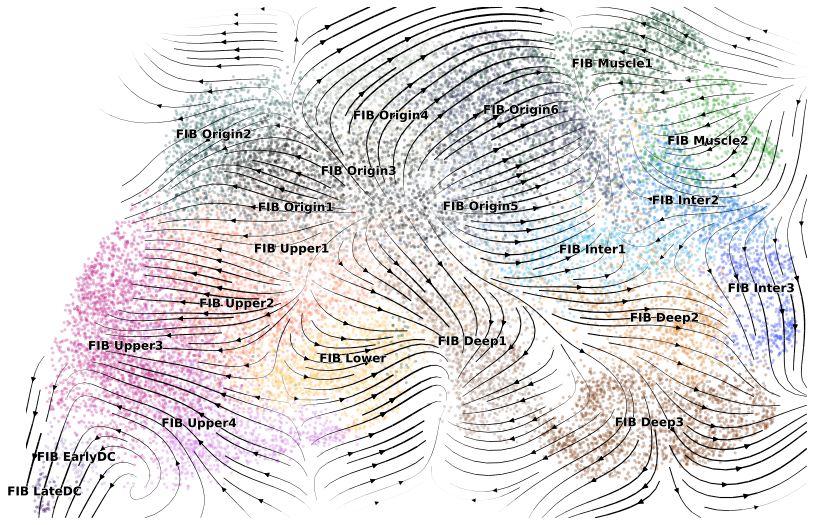

In [61]:
mult = 2
fig, ax = plt.subplots(figsize = (7*mult, 4.7*mult))
scv.pl.velocity_embedding_stream(adata_velo, basis='umap', legend_fontsize=12, title='', smooth=1.5, min_mass=1, color = ['leiden_named_DCsub'], dpi = 100,ax=ax, show = False, frameon = False)

## Regress cell cycle from spliced and unspliced counts

In [62]:
#Calculate cell cycle scores
sc.tl.score_genes_cell_cycle(adata_velo, s_genes=s_genes, g2m_genes=g2m_genes, copy = False)

In [63]:
#Regress out cell cycle and reassign corrected count matrices
counts_x = adata_velo.X.copy()
counts_s = adata_velo.layers['spliced'].copy()
counts_u = adata_velo.layers['unspliced'].copy()

adata_velo.X = counts_s
sc.pp.regress_out(adata_velo, keys = ['S_score', 'G2M_score'])
sc.pp.scale(adata_velo)
adata_velo.layers['spliced'] = adata_velo.X.copy()

adata_velo.X = counts_u
sc.pp.regress_out(adata_velo, keys = ['S_score', 'G2M_score'])
sc.pp.scale(adata_velo)
adata_velo.layers['unspliced'] = adata_velo.X.copy()

adata_velo.X = counts_x

... storing 'phase' as categorical


## Rerun velocity analysis based on HVGs after regression for cell cycle

In [64]:
scv.pp.moments(adata_velo, n_neighbors = 50, n_pcs = 20)
scv.tl.velocity(adata_velo, fit_offset = False, fit_offset2 = False, groupby = 'leiden_named_DCsub',use_highly_variable=True)
scv.tl.velocity_graph(adata_velo, n_neighbors = 50)

computing moments based on connectivities
    finished (0:00:39) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:11) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:01:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:06) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


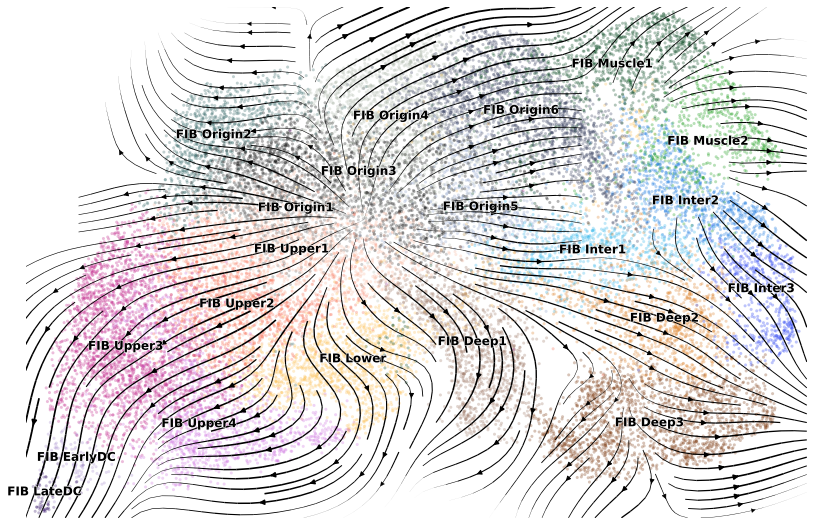

In [65]:
mult = 2
fig, ax = plt.subplots(figsize = (7*mult, 4.7*mult))
scv.pl.velocity_embedding_stream(adata_velo, basis='umap', legend_fontsize=12, title='', smooth=1.5, min_mass=1, color = ['leiden_named_DCsub'], dpi = 100,ax=ax, show = False, frameon = False)
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Velocity-On-UMAP-Labeled.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

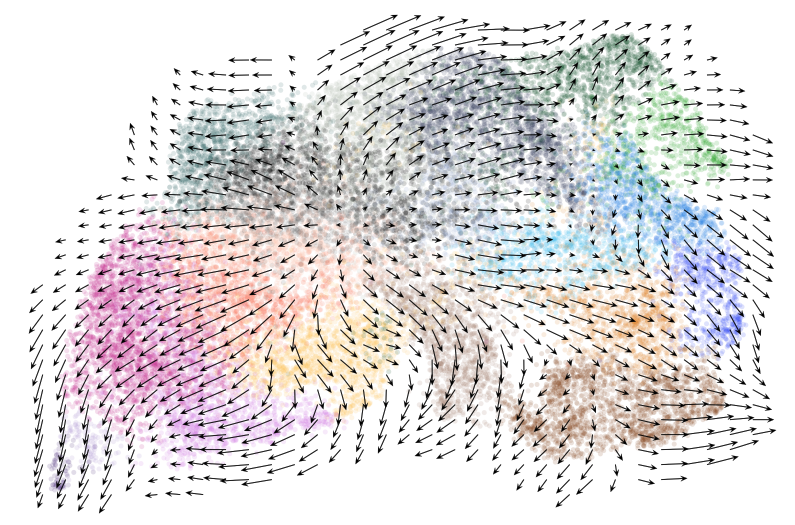

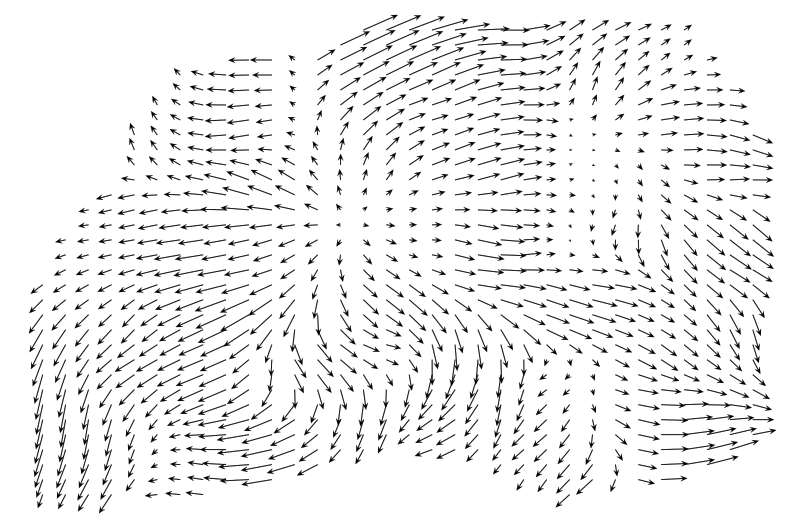

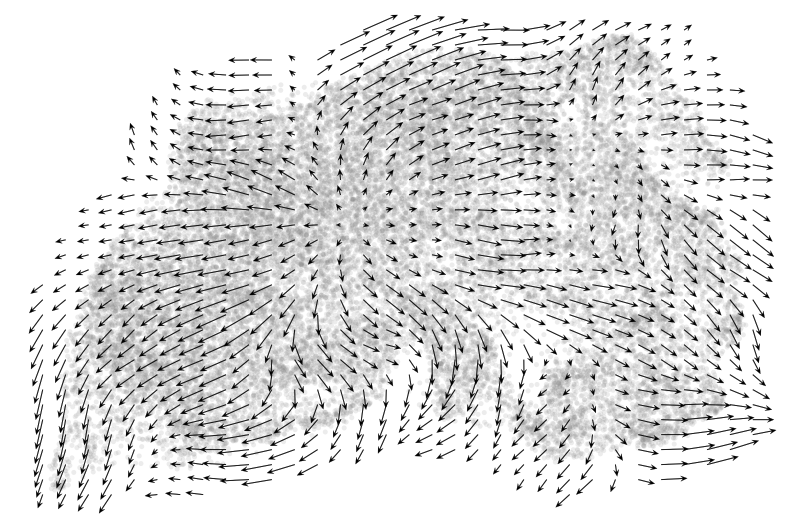

In [66]:
mult = 2
fig, ax = plt.subplots(figsize = (7*mult, 4.7*mult))
scv.pl.velocity_embedding_grid(adata_velo, basis='umap', legend_fontsize=12, title='', smooth=1, min_mass=1, s=100,alpha=0.15, color = ['leiden_named_DCsub'], ax = ax, show = False, frameon = False,arrow_color='black',arrow_size=1.4,arrow_length=5, density = 0.65)
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Velocity-On-UMAP-Unabeled.png'), transparent = True, bbox_inches = 'tight', dpi = 100)
mult = 2
fig, ax = plt.subplots(figsize = (7*mult, 4.7*mult))
scv.pl.velocity_embedding_grid(adata_velo, basis='umap', legend_fontsize=12, title='', smooth=1, min_mass=1, s=100,alpha=0, ax = ax, show = False, frameon = False,arrow_color='black',arrow_size=1.4,arrow_length=5, density = 0.65)
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Velocity-On-UMAP-Arrows-Only.png'), transparent = True, bbox_inches = 'tight', dpi = 100)
mult = 2
fig, ax = plt.subplots(figsize = (7*mult, 4.7*mult))
scv.pl.velocity_embedding_grid(adata_velo, basis='umap', legend_fontsize=12, title='', smooth=1, min_mass=1, s=100,alpha=0.15, ax = ax, show = False, frameon = False,arrow_color='black',arrow_size=1.4,arrow_length=5, density = 0.65)
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Velocity-On-UMAP-Grey.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

In [67]:
#Identify genes with strongest impact on velocity
scv.tl.rank_velocity_genes(adata_velo,groupby='leiden_named_DCsub',min_corr=.3)
df=scv.DataFrame(adata_velo.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:24) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,FIB Deep1,FIB Deep2,FIB Deep3,FIB EarlyDC,FIB Inter1,FIB Inter2,FIB Inter3,FIB LateDC,FIB Lower,FIB Muscle1,...,FIB Origin1,FIB Origin2,FIB Origin3,FIB Origin4,FIB Origin5,FIB Origin6,FIB Upper1,FIB Upper2,FIB Upper3,FIB Upper4
0,Ccdc68,Mapk10,Pknox2,Ptch2,Dpysl3,Arhgef4,Nexn,Fgf10,Nrxn1,Jaml,...,Egfl6,Cadm1,Mybpc1,Galnt17,Crip1,Rfx3,Dab1,Hmga2,Fhod3,Tmeff2
1,Kcnq5,Dtna,Sox5,Sphkap,Edil3,Adgrd1,Scara5,Pde3a,Zfp385b,Rerg,...,Clec3b,Clec3b,Jakmip2,Itm2a,Crabp1,Glis3,Mdga2,Col12a1,Sema6d,Neil3
2,Hes1,Ptger3,Hoxaas3,Ccnf,Zfpm2,Nav3,Zfhx3,Vat1l,Zfhx4,Clstn2,...,Lum,9530059O14Rik,Kcnj3,Ntm,Ccdc68,Syndig1,Nebl,Postn,Sphkap,Kifc5b
3,Gm29478,Runx2,Adgrb3,Spon1,Cemip,Adam23,Slc24a3,Eya2,Limch1,Hs3st5,...,Igfbp5,Srd5a2,Nkain3,Npas3,Thy1,Fmo1,Anks1b,Col8a1,Sytl2,Ect2
4,Ptchd4,Stk26,Iqgap2,Spc25,Galntl6,Limch1,Opcml,Gpm6b,Filip1l,Col11a1,...,Nt5e,Loxl1,Cdh12,Postn,Stmn2,Adamts19,Vav3,Klf7,Elmo1,Kifc1


In [68]:
#Display content of adata object to show which additional elements were added (e.g. velocity, velocity_score, velocity_umap, etc.)
adata_velo

AnnData object with n_obs × n_vars = 25856 × 2941
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'simp_index', 'invsimp_index', 'shan_index', 'perc_rpl', 'perc_rps', 'perc_hb.ab.', 'perc_mito', 'perc_hba', 'perc_hbb', 'perc_hist', 'filtered', 'sample_id', 'embryonic_age', 'genotype', 'dataset', 'sample_no', 'sample_code', 'sample_date', 'library', 'sequencing', 'sex', 'S.Score', 'G2M.Score', 'Phase', 'G1.Score', 'CC.Diff', 'HC_1', 'HC_2', 'HC_3', 'HC_4', 'HC_5', 'HC_6', 'HC_7', 'HC_8', 'HC_9', 'HC_10', 'HC_11', 'HC_12', 'HC_13', 'HC_14', 'HC_15', 'HC_16', 'HC_17', 'HC_18', 'HC_19', 'HC_20', 'HC_21', 'HC_22', 'HC_23', 'HC_24', 'HC_25', 'HC_26', 'HC_27', 'HC_28', 'HC_30', 'HC_31', 'HC_33', 'HC_35', 'HC_37', 'HC_39', 'HC_42', 'HC_45', 'HC_49', 'HC_53', 'HC_58', 'HC_64', 'HC_72', 'HC_82', 'HC_95', 'HC_112', 'HC_138', 'HC_180', 'HC_29', 'HC_40', 'HC_44', 'HC_47', 'HC_52', 'HC_73', 'HC_85', 'HC_101', 'HC_124', 'HC_161', 'leiden', 'leiden_named', 'leiden_named_DCsub', 'n_counts', 'veloc

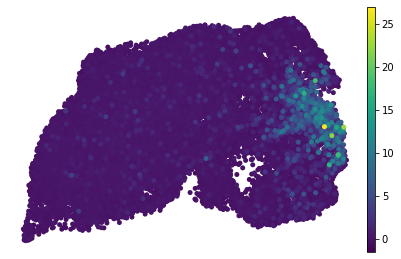

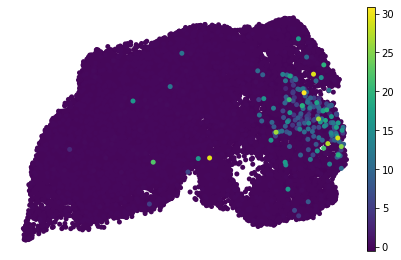

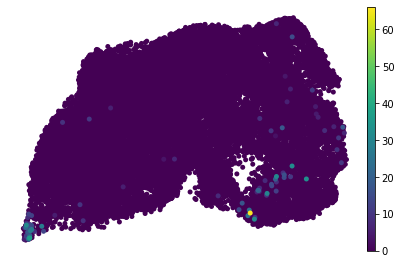

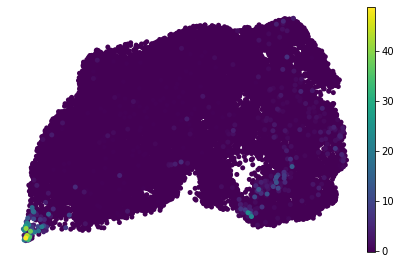

In [69]:
#Plot expression of spliced and unspliced variants of a gene
genelist=['Mfap5','Grin2a']
mult = 1
for gene in genelist:
    fig, ax = plt.subplots(figsize = (7*mult, 4.5*mult))
    sc.pl.umap(adata_velo, color =gene, layer='spliced', ax = ax, show = False, frameon = False, s = 100, title = '', alpha = 1)
    fig, ax = plt.subplots(figsize = (7*mult, 4.5*mult))
    sc.pl.umap(adata_velo, color =gene, layer='unspliced', ax = ax, show = False, frameon = False, s = 100, title = '', alpha = 1)

In [70]:
#Calculate velocity-based pseudotime
scv.tl.velocity_pseudotime(adata_velo)

computing terminal states
    identified 3 regions of root cells and 4 regions of end points .
    finished (0:00:02) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


<AxesSubplot:title={'center':'velocity pseudotime'}>

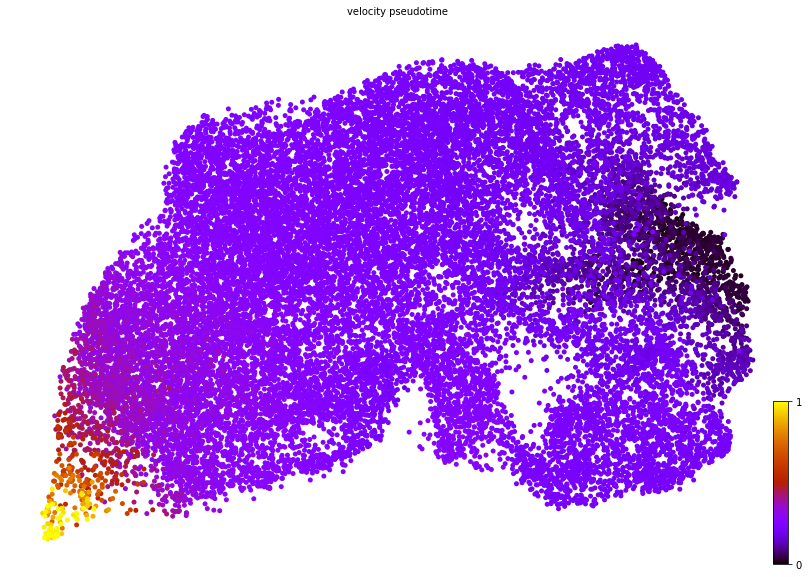

In [71]:
#Plot velocity-based pseudotime
mult=2
fig, ax = plt.subplots(figsize = (7*mult, 5*mult))
scv.pl.scatter(adata_velo,color='velocity_pseudotime',cmap='gnuplot', ax = ax, show = False, frameon = False,s=100)

## Save adata objects as h5ad file

In [72]:
adata.write_h5ad(os.path.join(path, 'Notebook-Output', 'Adata-object_{}.h5'.format(cell_type)))
adata_velo.write_h5ad(os.path.join(path, 'Notebook-Output', 'Adata-object_{}-subset-velocity-analysis.h5'.format(cell_type)))

## Save adata object as loom file

In [73]:
#H5ad files do not include velocity information. To also save velocity information, loom files are needed 
adata_velo.write_loom(os.path.join(path, 'Notebook-Output', '{}_WithVelocity.loom'.format(cell_type)), write_obsm_varm = True)

# Plotting

## Figure 2,3

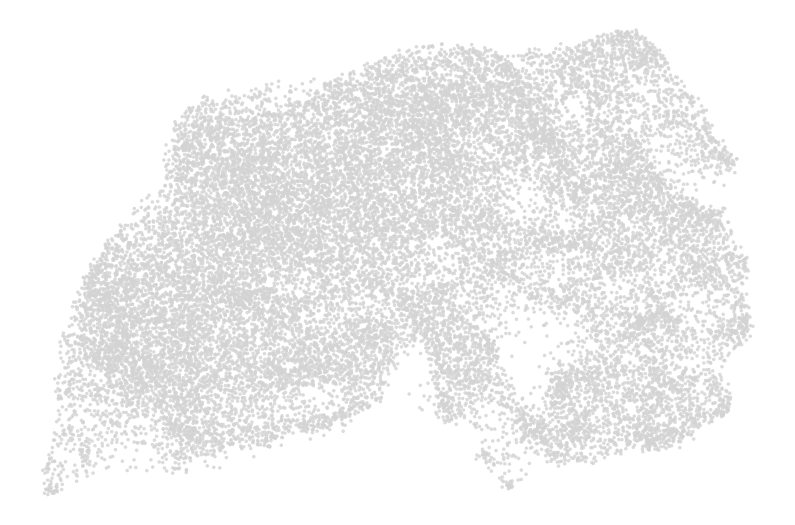

In [74]:
mult = 2
fig, ax = plt.subplots(figsize = (7*mult, 4.7*mult))
sc.pl.umap(adata, ax = ax, show = False, frameon = False, s = 50, title = '', alpha = 0.8)
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_UMAP_AllGray.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

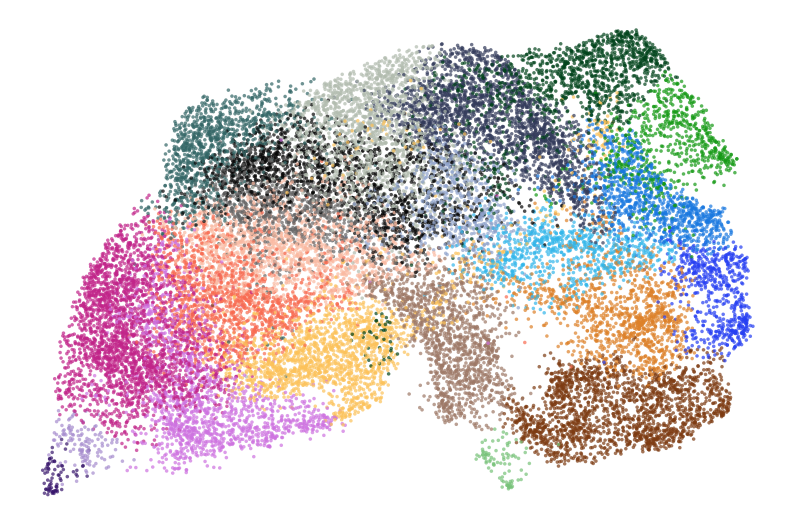

In [75]:
multiplier=2
fig, ax = plt.subplots(figsize = (7*multiplier, 4.7*multiplier))
sc.pl.umap(adata, ax = ax, show = False, frameon = False, s = 50, title = '', alpha = 0.7,color='leiden_named_DCsub')
ax.legend().remove()
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_UMAP_clusters.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

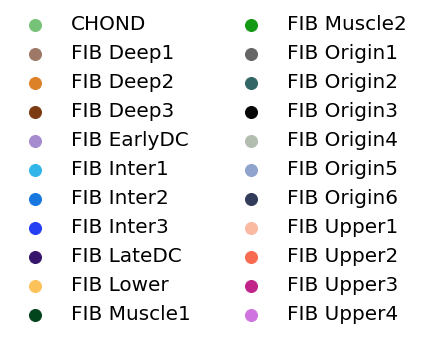

In [76]:
label_params = ax.get_legend_handles_labels()
figl, axl = plt.subplots()
axl.axis(False)
axl.legend(*label_params, loc="center", prop={"size":20},frameon=False,ncol=2,markerscale=2)
figl.savefig(os.path.join(path, 'Notebook-Output', 'Fib_UMAP_clusters_legend.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

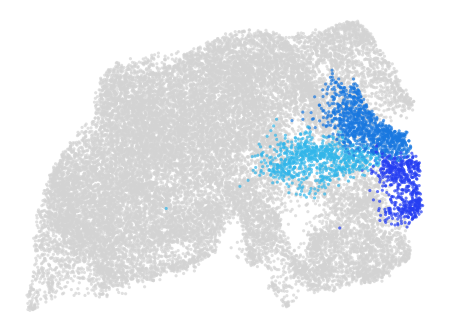

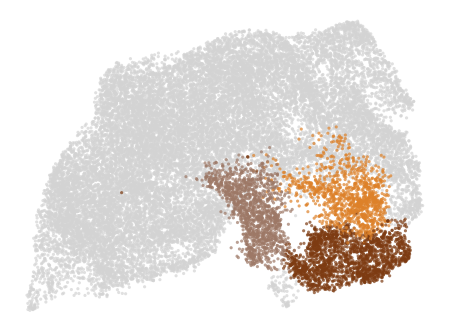

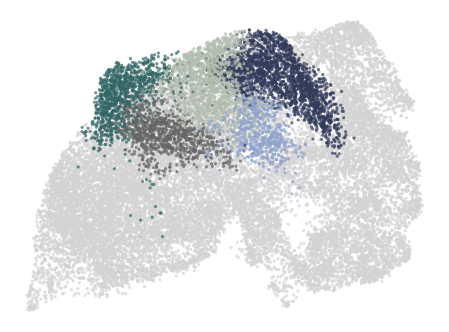

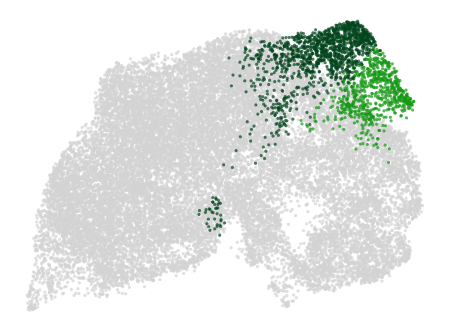

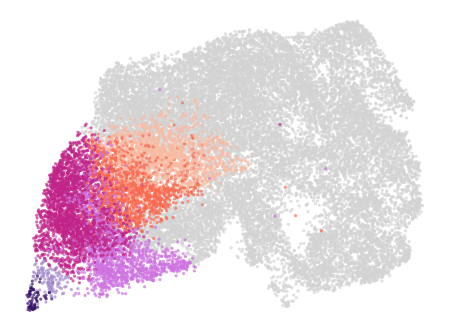

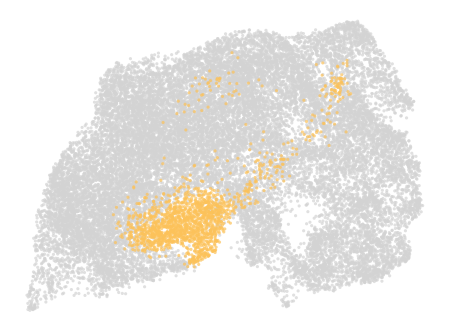

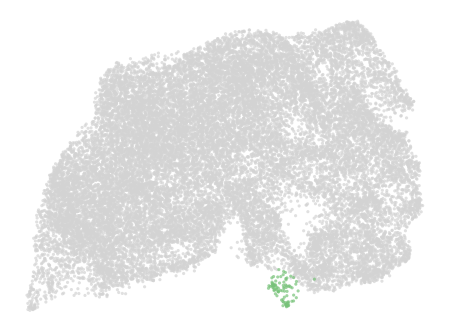

In [77]:
#Plot groups of Fibroblast subclusters in color onto grey UMAP
mult = 3
fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
sc.pl.umap(adata, ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 0.7,color='leiden_named_DCsub', groups=['FIB Inter1','FIB Inter2','FIB Inter3'])
ax.legend().remove()
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Groups_Inter.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
sc.pl.umap(adata, ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 0.7,color='leiden_named_DCsub', groups=['FIB Deep1','FIB Deep2','FIB Deep3'])
ax.legend().remove()
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Groups_Deep.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
sc.pl.umap(adata, ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 0.7,color='leiden_named_DCsub', groups=['FIB Origin1','FIB Origin2','FIB Origin2','FIB Origin4','FIB Origin5','FIB Origin6'])
ax.legend().remove()
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Groups_Origin.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
sc.pl.umap(adata, ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 0.7,color='leiden_named_DCsub', groups=['FIB Muscle1','FIB Muscle2'])
ax.legend().remove()
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Groups_Muscle.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
sc.pl.umap(adata, ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 0.7,color='leiden_named_DCsub', groups=['FIB Upper1','FIB Upper2','FIB Upper3','FIB Upper4','FIB EarlyDC','FIB LateDC'])
ax.legend().remove()
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Groups_Upper.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
sc.pl.umap(adata, ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 0.7,color='leiden_named_DCsub', groups=['FIB Lower'])
ax.legend().remove()
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Groups_Lower.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
sc.pl.umap(adata, ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 0.7,color='leiden_named_DCsub', groups=['CHOND'])
ax.legend().remove()
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Groups_Chond.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

In [78]:
#Generate color bar for plotting gene expression levels on top of UMAP
colors = [(0.8, 0.8, 0.8), (0.19, 0.04, 0.55)] # first color is grey, last is dark purple
cm = LinearSegmentedColormap.from_list("Custom", colors, N=200)

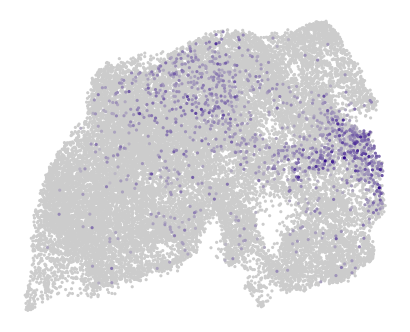

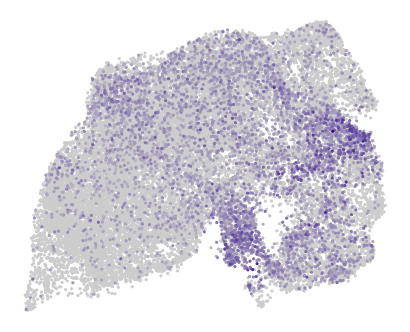

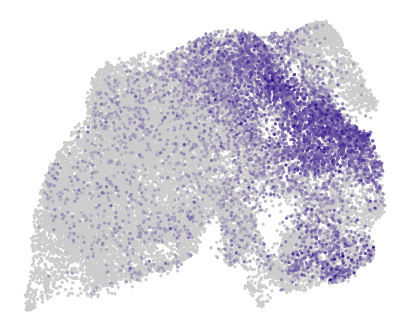

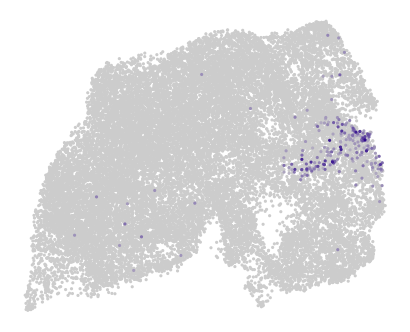

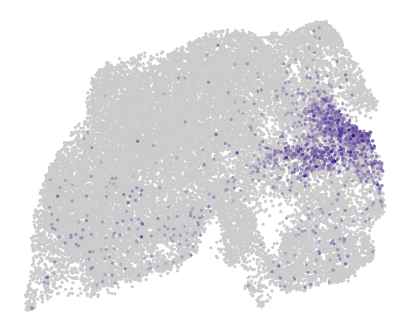

In [79]:
#Plotting gene expression of a couple of example genes onto the full UMAP (activate the desired genelist)
genelist=['Dpp4','Anxa3','Wnt2','Ly6a','Cd55']
#genelist=['Lef1','Axin2','Thbs1','Pdgfc','Ebf2','Postn','Hoxb8','Limch1','Mfap5','Gata6','Pparg','Vldlr','Cebpa','Dpp4','Nppc','Aspn','Igfbp3','Wnt4','Mia','Matn4','Sox5','Tagln','Acta2','Creb5','Ebf3','C1qtnf3','Mgp','Pitx2','Dkk1','Dkk2']
#genelist=['Tcf7','Sp5','Cadm1','Lox','Adam33','Epha4','Creb5','Thbs2','Cdh3']
#genelist=['Nov','Dpp4','Mfap5','Dpt','Wnt2','Plac8','Tmeff2','Col14a1','Creb5','Nrk']
mult = 3

for gene in genelist:
    fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
    sc.pl.umap(adata, color =gene, layer='normalized', ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 1, color_map=cm)
    ax.collections[-1].colorbar.remove()
    fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Expression_{}.png'.format(gene)), transparent = True, bbox_inches = 'tight', dpi = 100)
    #Get dimensions of plot (so we can reuse those dimensions when plotting only cells from a single time point)
    x_lims=ax.get_xlim()
    y_lims=ax.get_ylim()

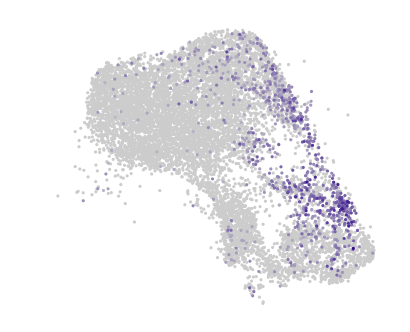

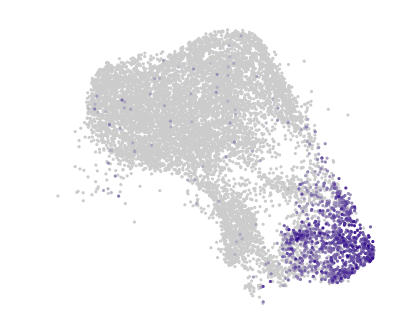

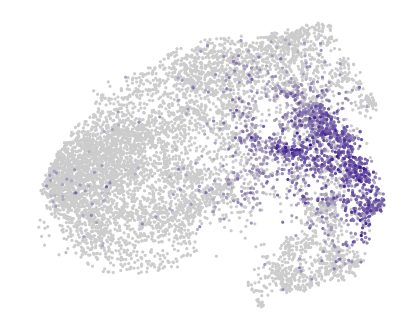

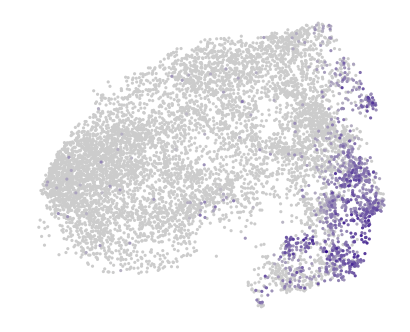

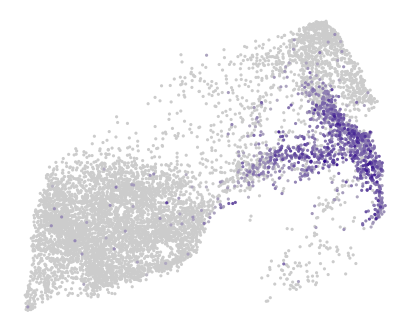

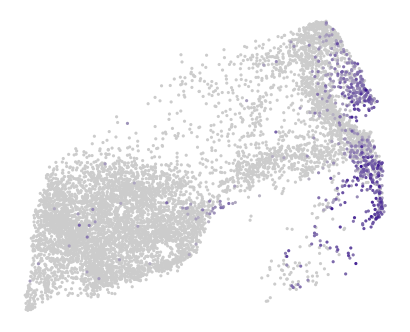

In [80]:
#Plotting gene expression of a couple of example genes onto the UMAP containing cells from only one embryonic time point
genelist=['Gata6','Ebf2']
mult = 3

for gene in genelist:
    fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
    sc.pl.umap(adata[adata.obs['embryonic_age']=='E12.5'], color =gene, layer='normalized', ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 1, color_map=cm)
    ax.collections[-1].colorbar.remove()
    ax.set_xlim(x_lims)
    ax.set_ylim(y_lims)
    fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Expression_E12_{}.png'.format(gene)), transparent = True, bbox_inches = 'tight', dpi = 100)
    
for gene in genelist:
    fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
    sc.pl.umap(adata[adata.obs['embryonic_age']=='E13.5'], color =gene, layer='normalized', ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 1, color_map=cm)
    ax.collections[-1].colorbar.remove()
    ax.set_xlim(x_lims)
    ax.set_ylim(y_lims)
    fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Expression_E13_{}.png'.format(gene)), transparent = True, bbox_inches = 'tight', dpi = 100)
    
for gene in genelist:
    fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
    sc.pl.umap(adata[adata.obs['embryonic_age']=='E14.5'], color =gene, layer='normalized', ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 1, color_map=cm)
    ax.collections[-1].colorbar.remove()
    ax.set_xlim(x_lims)
    ax.set_ylim(y_lims)    
    fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Expression_E14_{}.png'.format(gene)), transparent = True, bbox_inches = 'tight', dpi = 100)


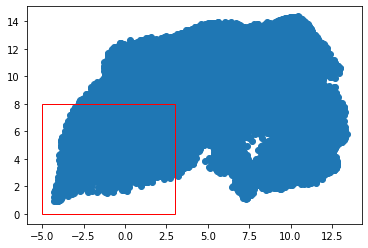

In [81]:
#Subset adata object to dermal condensate (DC) cells and those cells sitting clode to DC for plotting of only these cells
fig, ax = plt.subplots()
x,y = zip(*adata.obsm['X_umap'])
ax.scatter(x,y)
#Specify here which points (x,y) should make up the corners of the polygon
roi_coordinates = np.array([[-5,0],[-5,8],[3,8],[3,0]]) 
roi = mpl.patches.Polygon(roi_coordinates, fill = False, edgecolor = 'r', )
#Visualize region of interest to double check that the box is made correctly
ax.add_patch(roi)
#Subset to cells within the roi
roi_adata = adata[roi.get_path().contains_points(adata.obsm['X_umap'])]

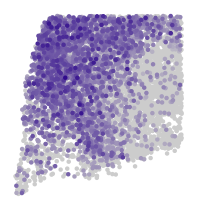

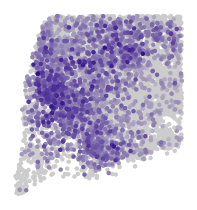

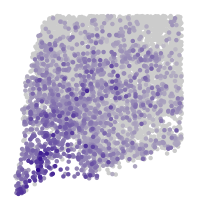

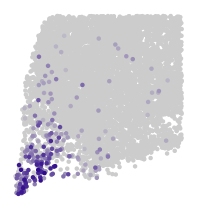

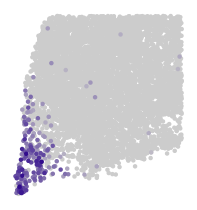

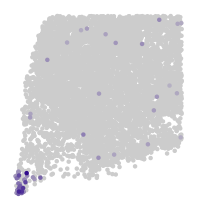

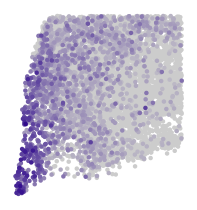

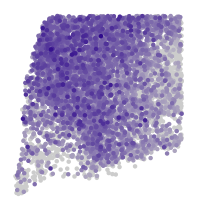

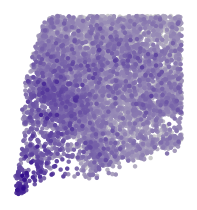

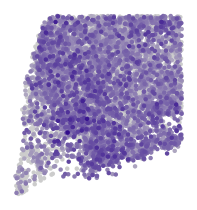

In [82]:
#Plot gene expression on DC cells and cells closeby only
genelist=['Notum','Cav1','Ptch1','Gal','Sox2','Dll1','Cdkn1a','Casz1','Btg1','Pcna']
mult = 3

for gene in genelist:
    fig, ax = plt.subplots(figsize = (1.2*mult, 1.2*mult))
    sc.pl.umap(roi_adata, color =gene, layer='normalized', ax = ax, show = False, frameon = False, s = 80, title = '', alpha = 1, color_map=cm)
    ax.collections[-1].colorbar.remove()
    fig.savefig(os.path.join(path, 'Notebook-Output', 'DC_Expression_{}.png'.format(gene)), transparent = True, bbox_inches = 'tight', dpi = 100)

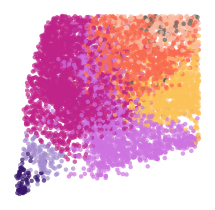

In [83]:
#Plot fibroblast subclusters on DC cells and cells closeby only
mult = 3
fig, ax = plt.subplots(figsize = (1.2*mult, 1.2*mult))
sc.pl.umap(roi_adata, ax = ax, show = False, frameon = False, s = 80, title = '', alpha = 0.7,color='leiden_named_DCsub')
ax.legend().remove()
fig.savefig(os.path.join(path, 'Notebook-Output', 'DC_Clustering.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

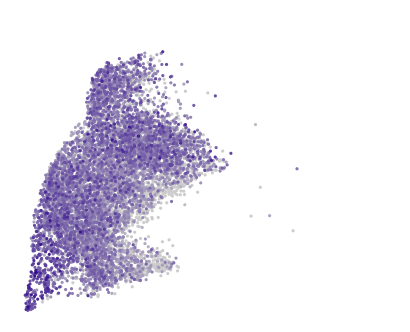

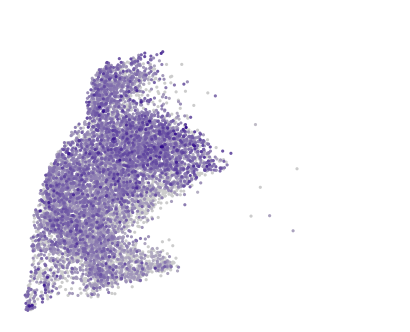

In [84]:
#Optional: Plot gene expression only for cells belonging to a predefined set of clusters
genelist=['Lef1','Axin2']
mult = 3

for gene in genelist:
    fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
    sc.pl.umap(adata[adata.obs['leiden_named_DCsub'].isin(['FIB Upper1','FIB Upper2','FIB Upper3','FIB Upper4','FIB Upper5','FIB Origin2','FIB Origin1','FIB EarlyDC','FIB LateDC'])], color =gene, layer='normalized', ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 1, color_map=cm)
    ax.collections[-1].colorbar.remove()
    ax.set_xlim(x_lims)
    ax.set_ylim(y_lims)

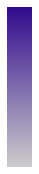

In [85]:
#Plot legend for expression plots
mult=3
fig, ax = plt.subplots(figsize=(0.15*mult, 1.95*mult))
fig.subplots_adjust(bottom=0.5)
cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cm,
                                orientation='vertical')
cb1.set_ticks([])
cb1.outline.set_visible(False)
fig.savefig(os.path.join(path, 'Notebook-Output', 'Colorbar_Expression.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

In [86]:
#Assign colors to categorical variable 'embryonic age'
adata.uns['embryonic_age_colors']=['#E00D75','#85C100','#3399C1']

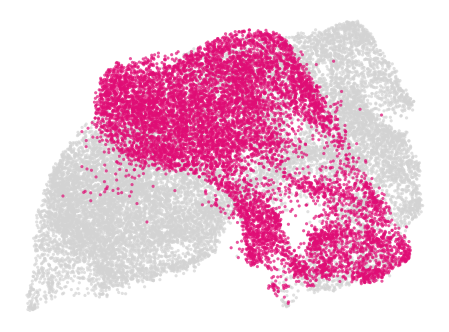

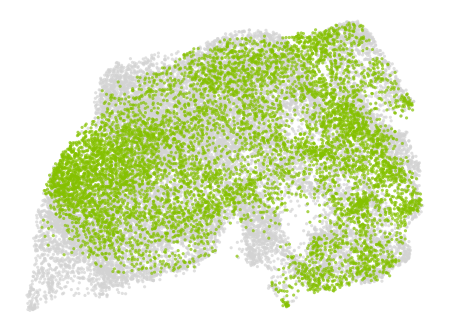

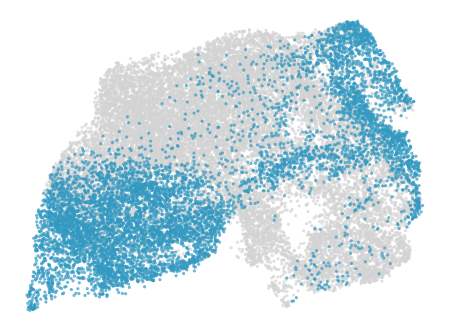

In [87]:
#Only highlight cells sampled at a specific embryonic age in color on top of a grey UMAP showing all fibroblasts
mult = 3
fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
sc.pl.umap(adata, ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 0.7,color='embryonic_age', groups=['E12.5'])
ax.legend().remove()
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Age_E12.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
sc.pl.umap(adata, ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 0.7,color='embryonic_age', groups=['E13.5'])
ax.legend().remove()
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Age_E13.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
sc.pl.umap(adata, ax = ax, show = False, frameon = False, s = 40, title = '', alpha = 0.7,color='embryonic_age', groups=['E14.5'])
ax.legend().remove()
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Age_E14.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

In [88]:
#Generate color bar for plotting gene expression levels in DotPlot
colors = [(1,1,1), (0.19, 0.04, 0.55)] # first color is white, last is dark purple
cm = LinearSegmentedColormap.from_list("Custom", colors, N=200)

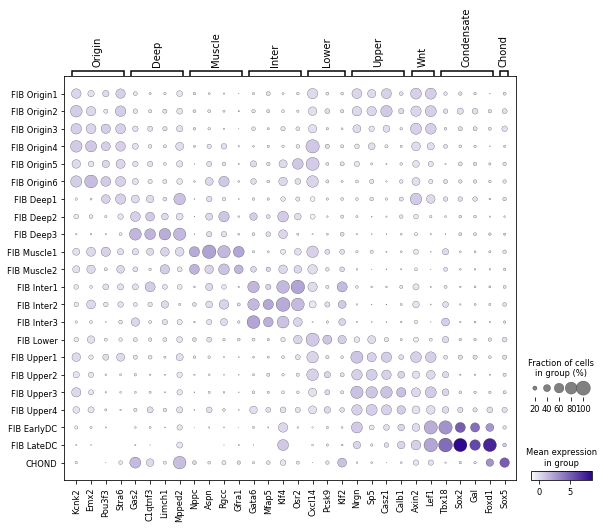

In [89]:
#Generate DotPlot to visualize markers setting apart the fibroblast subclusters
marker_genes_dict = {'Origin': ['Kcnk2','Emx2','Pou3f3','Stra6'],
                     'Deep': ['Gas2','C1qtnf3','Limch1','Mpped2'],
                    'Muscle': ['Nppc','Aspn','Rgcc','Gfra1'],
                     'Inter': ['Gata6','Mfap5','Klf4', 'Osr2'],
                    'Lower': ['Cxcl14','Pcsk9','Klf2'],
                    'Upper': ['Nrgn','Sp5','Casz1','Calb1'],
                    'Wnt': ['Axin2','Lef1'], 
                     'Condensate': ['Tbx18','Sox2','Gal','Foxd1'],
                    'Chond':['Sox5']}

mult=1.5
fig, ax = plt.subplots(figsize=(6.3*mult,5.6*mult))
sc.pl.dotplot(adata, marker_genes_dict, groupby='leiden_named_DCsub',dendrogram=False, ax=ax,show=False,cmap=cm,categories_order=['FIB Origin1','FIB Origin2','FIB Origin3','FIB Origin4','FIB Origin5','FIB Origin6','FIB Deep1','FIB Deep2','FIB Deep3','FIB Muscle1','FIB Muscle2','FIB Inter1','FIB Inter2','FIB Inter3','FIB Lower','FIB Upper1','FIB Upper2','FIB Upper3','FIB Upper4','FIB EarlyDC','FIB LateDC','CHOND'])
fig.savefig(os.path.join(path, 'Notebook-Output', 'FIB_Dotplot.pdf'), transparent = True, bbox_inches = 'tight', dpi = 100)

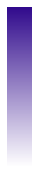

In [90]:
#Plot legend for dot plots
mult=3
fig, ax = plt.subplots(figsize=(0.15*mult, 1.95*mult))
fig.subplots_adjust(bottom=0.5)
cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cm,
                                orientation='vertical')
cb1.set_ticks([])
cb1.outline.set_visible(False)
fig.savefig(os.path.join(path, 'Notebook-Output', 'Colorbar_Expression_whitetopurple.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

## Figure 4

In [91]:
#Calculate density maps for distribution of cells from different embryonic time points
sc.tl.embedding_density(adata, basis = 'umap', groupby = 'embryonic_age')

[<AxesSubplot:>]
[<AxesSubplot:>]
[<AxesSubplot:>]


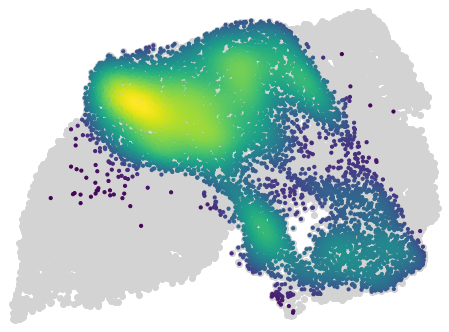

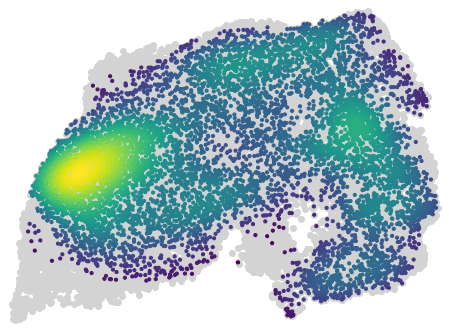

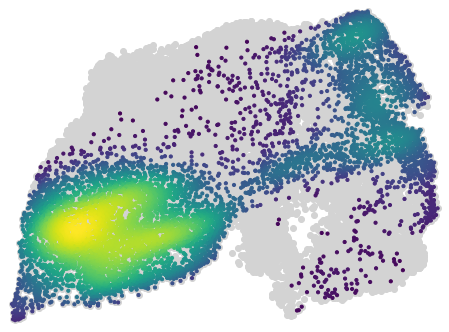

In [92]:
#Plot density maps for distribution of cells from different embryonic time points
mult = 3

fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
s = 10
add_perc = 0.2
umap = adata.obsm['X_umap']
tmp_values_pos = adata[adata.obs['embryonic_age']=='E12.5'].obs['umap_density_embryonic_age'].values
tmp_umap_pos = adata[adata.obs['embryonic_age']=='E12.5'].obsm['X_umap']
rank = np.argsort(tmp_values_pos)
sorted_values = tmp_values_pos[rank]
sorted_umap = tmp_umap_pos[rank]
ax.scatter(x = umap[:, 0], y = umap[:, 1], color = 'lightgrey')
ax.scatter(x = sorted_umap[:, 0], y = sorted_umap[:, 1], color = [plt.cm.viridis(x) for x in sorted_values], s = s)
ax.set_xlim([umap[:,0].min()-add_perc, umap[:,0].max()+add_perc])
ax.set_ylim([umap[:,1].min()-add_perc, umap[:,1].max()+add_perc])
clean_axis(ax)
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Age_E12_density.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
s = 10
add_perc = 0.2
umap = adata.obsm['X_umap']
tmp_values_pos = adata[adata.obs['embryonic_age']=='E13.5'].obs['umap_density_embryonic_age'].values
tmp_umap_pos = adata[adata.obs['embryonic_age']=='E13.5'].obsm['X_umap']
rank = np.argsort(tmp_values_pos)
sorted_values = tmp_values_pos[rank]
sorted_umap = tmp_umap_pos[rank]
ax.scatter(x = umap[:, 0], y = umap[:, 1], color = 'lightgrey')
ax.scatter(x = sorted_umap[:, 0], y = sorted_umap[:, 1], color = [plt.cm.viridis(x) for x in sorted_values], s = s)
ax.set_xlim([umap[:,0].min()-add_perc, umap[:,0].max()+add_perc])
ax.set_ylim([umap[:,1].min()-add_perc, umap[:,1].max()+add_perc])
clean_axis(ax)
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Age_E13_density.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

fig, ax = plt.subplots(figsize = (2.6*mult, 1.95*mult))
s = 10
add_perc = 0.2
umap = adata.obsm['X_umap']
tmp_values_pos = adata[adata.obs['embryonic_age']=='E14.5'].obs['umap_density_embryonic_age'].values
tmp_umap_pos = adata[adata.obs['embryonic_age']=='E14.5'].obsm['X_umap']
rank = np.argsort(tmp_values_pos)
sorted_values = tmp_values_pos[rank]
sorted_umap = tmp_umap_pos[rank]
ax.scatter(x = umap[:, 0], y = umap[:, 1], color = 'lightgrey')
ax.scatter(x = sorted_umap[:, 0], y = sorted_umap[:, 1], color = [plt.cm.viridis(x) for x in sorted_values], s = s)
ax.set_xlim([umap[:,0].min()-add_perc, umap[:,0].max()+add_perc])
ax.set_ylim([umap[:,1].min()-add_perc, umap[:,1].max()+add_perc])
clean_axis(ax)
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Age_E14_density.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

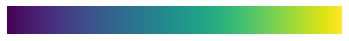

In [93]:
#Plot legend for density maps
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)
cb1 = mpl.colorbar.ColorbarBase(ax, cmap=plt.cm.viridis,
                                orientation='horizontal')
cb1.set_ticks([])
cb1.outline.set_visible(False)
fig.savefig(os.path.join(path, 'Notebook-Output', 'Colorbar_Viridis.pdf'), transparent = True, bbox_inches = 'tight', dpi = 600)

## Figure S2, S3

In [94]:
## Calculate age distribution
age_dist = adata.obs[['embryonic_age', 'leiden_named_DCsub']]
age_dist = pd.DataFrame(age_dist.groupby(by = 'leiden_named_DCsub')['embryonic_age'].value_counts().div(age_dist.groupby(by = 'leiden_named_DCsub')['embryonic_age'].count()))
age_dist.columns = ['Fraction']
age_dist = age_dist.reset_index()
age_dist = age_dist.pivot(index = 'leiden_named_DCsub', columns = 'embryonic_age', values = 'Fraction')
age_dist = age_dist.sort_values(by=['E12.5','E13.5'],ascending=False)
age_dist

embryonic_age,E12.5,E13.5,E14.5
leiden_named_DCsub,,,
FIB Origin3,0.892361,0.100694,0.006944
FIB Origin2,0.838194,0.159925,0.001881
FIB Origin6,0.769416,0.222383,0.008201
FIB Deep1,0.735358,0.205351,0.059291
FIB Origin1,0.680162,0.282389,0.037449
FIB Origin5,0.669826,0.303318,0.026856
FIB Deep3,0.658602,0.293011,0.048387
FIB Origin4,0.620108,0.336544,0.043347
FIB Deep2,0.589347,0.369416,0.041237


In [95]:
#Set order for plotting fibroblast subclusters
order = ['FIB Origin1','FIB Origin2','FIB Origin3','FIB Origin4','FIB Origin5','FIB Origin6','FIB Deep1','FIB Deep2','FIB Deep3','FIB Upper1','FIB Upper2','FIB Upper3','FIB Upper4','FIB EarlyDC','FIB LateDC','FIB Lower','FIB Muscle1','FIB Muscle2','FIB Inter1','FIB Inter2','FIB Inter3','CHOND']
age_dist = age_dist.loc[order]

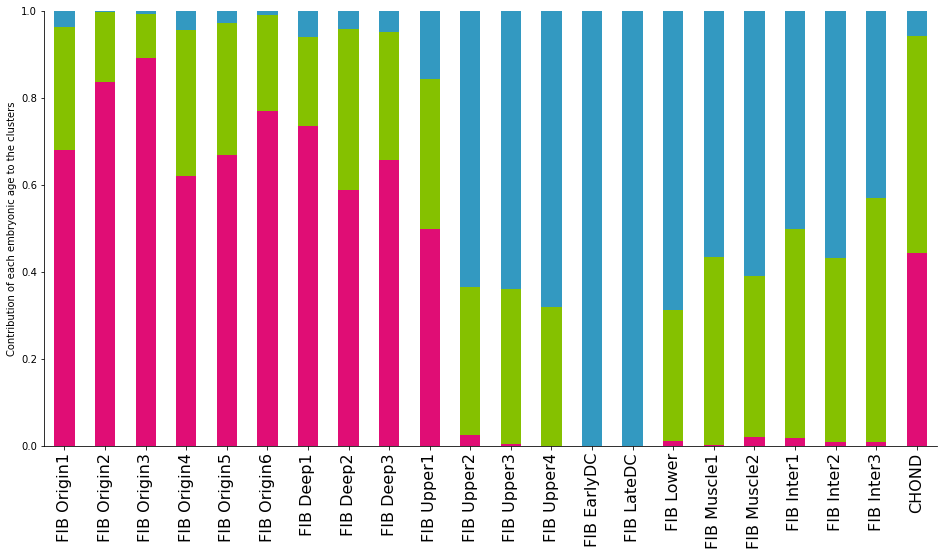

In [96]:
#Plot age distribution of the fibroblast subclusters (how many cells of each subcluster originate from which embryonic age?)
#Note: This plot can be saved with or without labels on x and y axis
cmap = {'E12.5': '#E00D75',
        'E13.5': '#85C100',
        'E14.5': '#3399C1'}

mult=2
fig, ax = plt.subplots(figsize = (8*mult, 4*mult))
age_dist.plot.bar(stacked = True, ax = ax, color = cmap.values())
handles, labels = ax.get_legend_handles_labels()
ax.legend().remove()
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

ax.set_ylim([0,1])
ax.set_xlabel('')
ax.set_xticklabels(labels = ax.get_xticklabels(), fontsize = 16, rotation = 90)  #Comment out if no labels are desired
ax.set_ylabel('Contribution of each embryonic age to the clusters')    #Comment out if no labels are desired
#ax.set_xticklabels([])    #Activate if no labels are desired
#ax.set_yticklabels([])    #Activate if no labels are desired
clear_output()
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Age-Contribution_WithLabels.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

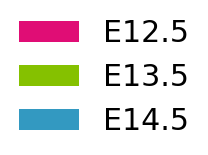

In [97]:
#Plot legend for barplots of age distribution
label_params = ax.get_legend_handles_labels()
figl, axl = plt.subplots(figsize = (2, 2))
axl.axis(False)
axl.legend(*label_params, loc="center", prop={"size":30},frameon=False,ncol=1,markerscale=2)
figl.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Age-Contribution_Legend.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

In [98]:
## Calculate cell cycle distribution
cc_dist = adata.obs[['Phase', 'leiden_named_DCsub']]
cc_dist = pd.DataFrame(cc_dist.groupby(by = 'leiden_named_DCsub')['Phase'].value_counts().div(cc_dist.groupby(by = 'leiden_named_DCsub')['Phase'].count()))
cc_dist.columns = ['Fraction']
cc_dist = cc_dist.reset_index()
cc_dist = cc_dist.pivot(index = 'leiden_named_DCsub', columns = 'Phase', values = 'Fraction')
cc_dist = cc_dist.sort_values(by=['G1','G2M'],ascending=False)
cc_dist

Phase,G1,G2M,S
leiden_named_DCsub,,,
FIB LateDC,0.943662,NaN,0.056338
FIB Inter1,0.743842,0.137931,0.118227
FIB Deep3,0.738172,0.129032,0.132796
FIB Deep2,0.724227,0.144330,0.131443
CHOND,0.670455,0.136364,0.193182
FIB Muscle1,0.654395,0.160781,0.184823
FIB EarlyDC,0.622047,0.157480,0.220472
FIB Inter2,0.609879,0.180444,0.209677
FIB Inter3,0.594324,0.146912,0.258765


In [99]:
#Set order for plotting fibroblast subclusters
order = ['FIB Origin1','FIB Origin2','FIB Origin3','FIB Origin4','FIB Origin5','FIB Origin6','FIB Deep1','FIB Deep2','FIB Deep3','FIB Upper1','FIB Upper2','FIB Upper3','FIB Upper4','FIB EarlyDC','FIB LateDC','FIB Lower','FIB Muscle1','FIB Muscle2','FIB Inter1','FIB Inter2','FIB Inter3','CHOND']
cc_dist = cc_dist.loc[order]

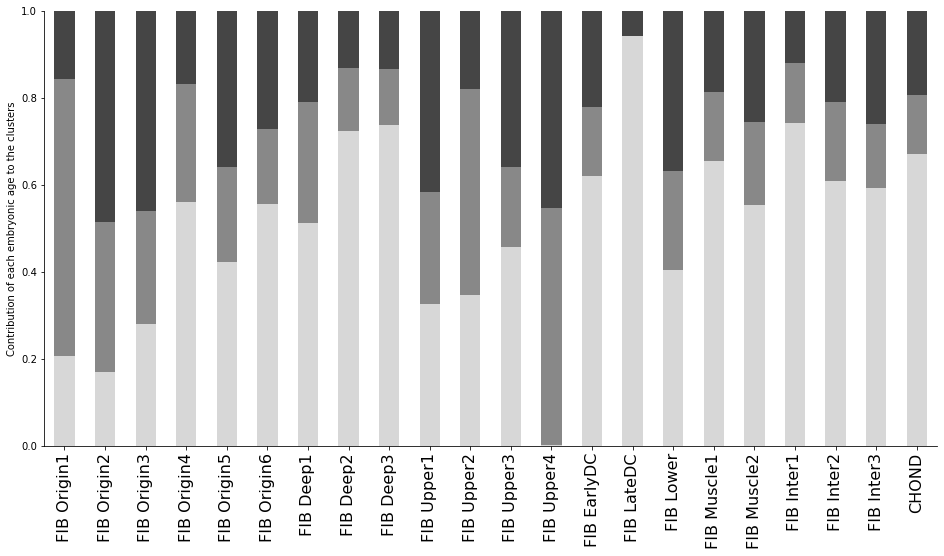

In [100]:
#Plot age distribution of the fibroblast subclusters (how many cells of each subcluster are in which cell cycle phase?)
#Note: This plot can be saved with or without labels on x and y axis
cmap = {'G1': '#D7D7D7',
        'G2M': '#888888',
        'S': '#454545'}

mult=2
fig, ax = plt.subplots(figsize = (8*mult, 4*mult))
cc_dist.plot.bar(stacked = True, ax = ax, color = cmap.values())
handles, labels = ax.get_legend_handles_labels()
ax.legend().remove()
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

ax.set_ylim([0,1])
ax.set_xlabel('')
ax.set_xticklabels(labels = ax.get_xticklabels(), fontsize = 16, rotation = 90)  #Comment out if no labels are desired
ax.set_ylabel('Contribution of each embryonic age to the clusters')    #Comment out if no labels are desired
#ax.set_xticklabels([])    #Activate if no labels are desired
#ax.set_yticklabels([])    #Activate if no labels are desired
clear_output()
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_CellCycle-Contribution_WithLabels.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

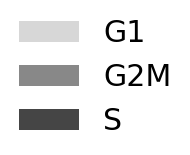

In [101]:
#Plot legend for barplots of cell cycle distribution
label_params = ax.get_legend_handles_labels()
figl, axl = plt.subplots(figsize = (2, 2))
axl.axis(False)
axl.legend(*label_params, loc="center", prop={"size":30},frameon=False,ncol=1,markerscale=2)
figl.savefig(os.path.join(path, 'Notebook-Output', 'Fib_CellCycle-Contribution_Legend.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

In [102]:
#Read in pre-computed table with number of ligands and receptors among marker genes for each subcluster 
df = pd.read_excel(os.path.join(path, 'Notebook-Input','Number_ExpressedReceptorsAndLigands.xlsx'), index_col = 0, engine = 'openpyxl',sheet_name='FIB')
df = df.reset_index()
df = df.melt(id_vars = ['index'], value_vars = ['ligands','receptors'])
df

,index,variable,value
0,FIB Origin1,ligands,9
1,FIB Origin2,ligands,6
2,FIB Origin3,ligands,9
3,FIB Origin4,ligands,10
4,FIB Origin5,ligands,8
5,FIB Origin6,ligands,14
6,FIB Deep1,ligands,25
7,FIB Deep2,ligands,26
8,FIB Deep3,ligands,26
9,FIB Upper1,ligands,6


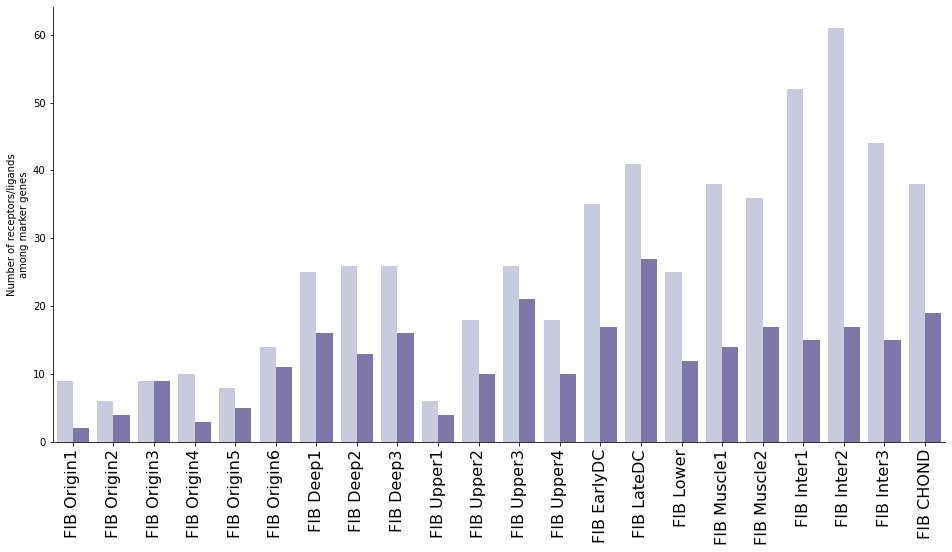

In [103]:
#Plot number of receptors/ligands per subcluster
#Note: This plot can be saved with or without labels on x and y axis
mult=2
fig, ax = plt.subplots(figsize = (8*mult, 4*mult))
sbn.barplot(data = df, x = 'index', y = 'value', hue = 'variable', ax = ax, palette = 'Purples')
handles, labels = ax.get_legend_handles_labels()
ax.legend().remove()
ax.set_xticklabels(labels = ax.get_xticklabels(), fontsize = 16, rotation = 90)  
ax.set_xlabel('')
ax.set_ylabel('Number of receptors/ligands\namong marker genes')     #Comment out if no labels are desired
[ax.spines[side].set_visible(False) for side in ['top','right']]

#ax.set_ylabel('')            #Activate if no labels are desired
#ax.set_xticklabels([])    #Activate if no labels are desired
#ax.set_yticklabels([])    #Activate if no labels are desired
clear_output()
fig.savefig(os.path.join(path, 'Notebook-Output', 'FIB_NumberReceptorLigand_WithLabels.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

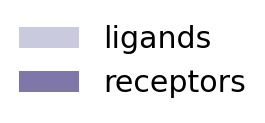

In [104]:
#Plot legend for barplots of ligands/receptors
label_params = ax.get_legend_handles_labels()
figl, axl = plt.subplots(figsize = (2, 2))
axl.axis(False)
axl.legend(*label_params, loc="center", prop={"size":30},frameon=False,ncol=1,markerscale=2)
figl.savefig(os.path.join(path, 'Notebook-Output', 'FIB_NumberReceptorLigand_Legend.png'), transparent = True, bbox_inches = 'tight', dpi = 100)

In [105]:
#Grouping fibroblast subclusters into major fibroblast groups for plotting purposes
naming_dict = {'FIB Origin1':'FIB Origin','FIB Origin2':'FIB Origin','FIB Origin3':'FIB Origin','FIB Origin4':'FIB Origin','FIB Origin5':'FIB Origin','FIB Origin6':'FIB Origin','FIB Deep1':'FIB Deep','FIB Deep2':'FIB Deep','FIB Deep3':'FIB Deep','FIB Upper1':'FIB Upper','FIB Upper2':'FIB Upper','FIB Upper3':'FIB Upper','FIB Upper4':'FIB Upper','FIB EarlyDC':'FIB DC','FIB LateDC':'FIB DC','FIB Lower':'FIB Lower','FIB Muscle1':'FIB Muscle','FIB Muscle2':'FIB Muscle','FIB Inter1':'FIB Inter','FIB Inter2':'FIB Inter','FIB Inter3':'FIB Inter','CHOND':'CHOND'}
adata.obs['leiden_grouped'] = [naming_dict[x] for x in adata.obs['leiden_named_DCsub']]
adata.obs['leiden_grouped'] = adata.obs['leiden_grouped'].astype('category')

In [106]:
#Display names of fibroblast subclusters
adata.obs['leiden_named_DCsub'].cat.categories

Index(['CHOND', 'FIB Deep1', 'FIB Deep2', 'FIB Deep3', 'FIB EarlyDC',
       'FIB Inter1', 'FIB Inter2', 'FIB Inter3', 'FIB LateDC', 'FIB Lower',
       'FIB Muscle1', 'FIB Muscle2', 'FIB Origin1', 'FIB Origin2',
       'FIB Origin3', 'FIB Origin4', 'FIB Origin5', 'FIB Origin6',
       'FIB Upper1', 'FIB Upper2', 'FIB Upper3', 'FIB Upper4'],
      dtype='object')

In [107]:
#Display colors of fibroblast subclusters
adata.uns['leiden_named_DCsub_colors']

['#77C279',
 '#9D7866',
 '#DD8129',
 '#7D3B12',
 '#A68CCE',
 '#32B6EA',
 '#1978E0',
 '#253EF2',
 '#37156B',
 '#FCC25A',
 '#02441C',
 '#149914',
 '#666565',
 '#336666',
 '#070707',
 '#B2BCAF',
 '#8FA3CC',
 '#333B5B',
 '#FABAA2',
 '#F86B51',
 '#C12489',
 '#CE73E0']

In [108]:
#Display names of grouped fibroblast subclusters
adata.obs['leiden_grouped'].cat.categories

Index(['CHOND', 'FIB DC', 'FIB Deep', 'FIB Inter', 'FIB Lower', 'FIB Muscle',
       'FIB Origin', 'FIB Upper'],
      dtype='object')

In [109]:
#Assign colors of grouped fibroblast subclusters
adata.uns['leiden_grouped_colors'] = ['#77C279','#634493','#9D7866','#1978E0','#FCC25A','#149914','#8FA3CC','#F86B51']

ax = axes[ix]


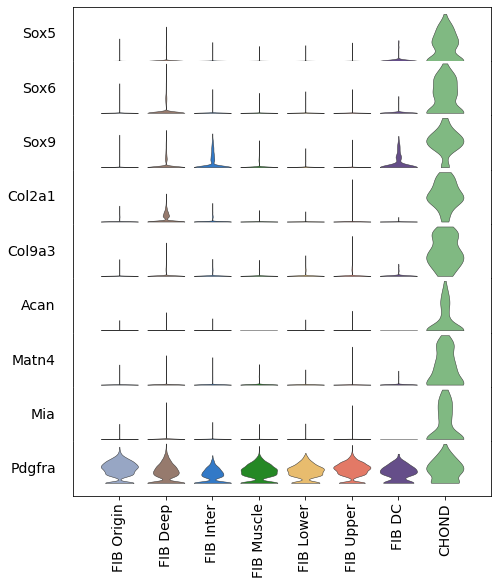

In [110]:
#Generate violin plots with marker genes setting apart the fibroblast subclusters (choose suitable marker gene list)
#Note: These plots can be saved with or without labels on x and y axis

#Chondrocyte markers
marker_genes=['Sox5', 'Sox6', 'Sox9', 'Col2a1','Col9a3', 'Acan', 'Matn4', 'Mia','Pdgfra']
#FIB muscle markers
#marker_genes=['Col1a1','Col1a2','Col3a1','Col4a1','Col4a2','Col6a1','Col6a2']

cluster_order = ['FIB Origin','FIB Deep','FIB Inter','FIB Muscle','FIB Lower', 'FIB Upper', 'FIB DC', 'CHOND']
layer = 'normalized'

ncols = 1
mult=3
fig, axes = initialize_subplots(len(marker_genes), ncols = ncols, figsize_multiplier=(7.5,1), gridspec_kw = {'hspace':0.0})

for ix, gene in enumerate(marker_genes):
    ax = axes[ix]
    sc.pl.violin(adata,keys=gene, groupby = 'leiden_grouped', cut = 0, ax = ax, show = False, stripplot = False, linewidth = 0.5, layer = layer, order = cluster_order)
   
    if ix == len(marker_genes)-1:
        ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, fontsize = 14)
        ax.spines['top'].set_visible(False)
        ax.set_ylim([-1, ax.get_ylim()[1]])
    else:
        ax.set_xticklabels([])
        ax.set_xticks([])
        if ix == 0:
            ax.spines['bottom'].set_visible(False)
            ax.set_ylim([0, ax.get_ylim()[1] + 0.1*ax.get_ylim()[1]])
        else:
            ax.spines['top'].set_visible(False)
            ax.spines['bottom'].set_visible(False)
    
    ax.set_ylabel(gene, fontsize = 14, rotation = 0, labelpad = 10, horizontalalignment='right', verticalalignment='center')   #Activate if labels are desired
    #ax.set_ylabel('')            #Comment out if labels are desired
    ax.yaxis.set_ticks_position('none')      

    ax.set_yticklabels([])                                                  #If no min-max values are desired
    #ax.tick_params(axis = 'y', labelsize = 14)                             #To add min-max values on y axis
    #ax.yaxis.set_major_locator(MaxNLocator(integer = True, nbins = 2))     #To add min-max values on y axis
    #ax.set_yticks([x for x in ax.get_yticks() if x>0][:1])                 #To add min-max values on y axis
    
    ax.set_xlabel('')
    ax.set_xlim(ax.get_xlim()[0]-0.5, ax.get_xlim()[1]+0.5)
    #ax.set_xticklabels([])        #Comment out if labels are desired
    
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Vln_Chond_WithLabels.pdf'), transparent = True, bbox_inches = 'tight', dpi = 100)

ax = axes[ix]


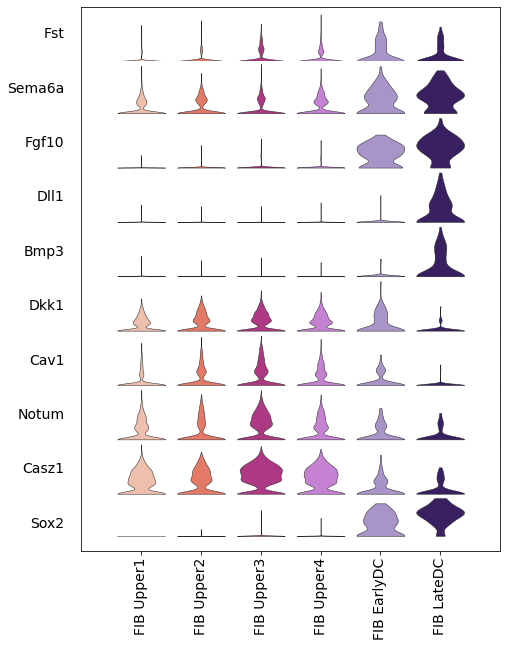

In [111]:
#Generate violin plots with marker genes setting apart the fibroblast subclusters (choose suitable marker gene list)

#FIB DC markers
marker_genes=['Fst','Sema6a','Fgf10','Dll1','Bmp3','Dkk1','Cav1','Notum','Casz1','Sox2']

cluster_order = ['FIB Upper1','FIB Upper2','FIB Upper3','FIB Upper4','FIB EarlyDC','FIB LateDC']
layer = 'normalized'

ncols = 1
mult=3
fig, axes = initialize_subplots(len(marker_genes), ncols = ncols, figsize_multiplier=(7.5,1), gridspec_kw = {'hspace':0.0})

for ix, gene in enumerate(marker_genes):
    ax = axes[ix]
    sc.pl.violin(adata[adata.obs['leiden_named_DCsub'].isin(['FIB Upper1','FIB Upper2','FIB Upper3','FIB Upper4','FIB EarlyDC','FIB LateDC'])],keys=gene, groupby = 'leiden_named_DCsub', cut = 0, ax = ax, show = False, stripplot = False, linewidth = 0.5, layer = layer, order = cluster_order)
   
    if ix == len(marker_genes)-1:
        ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, fontsize = 14)
        ax.spines['top'].set_visible(False)
        ax.set_ylim([-1, ax.get_ylim()[1]])
    else:
        ax.set_xticklabels([])
        ax.set_xticks([])
        if ix == 0:
            ax.spines['bottom'].set_visible(False)
            ax.set_ylim([0, ax.get_ylim()[1] + 0.1*ax.get_ylim()[1]])
        else:
            ax.spines['top'].set_visible(False)
            ax.spines['bottom'].set_visible(False)
    
    ax.set_ylabel(gene, fontsize = 14, rotation = 0, labelpad = 10, horizontalalignment='right', verticalalignment='center')   #Activate if labels are desired
    #ax.set_ylabel('')            #Comment out if labels are desired
    ax.yaxis.set_ticks_position('none')      

    ax.set_yticklabels([])                                                  #If no min-max values are desired
    #ax.tick_params(axis = 'y', labelsize = 14)                             #To add min-max values on y axis
    #ax.yaxis.set_major_locator(MaxNLocator(integer = True, nbins = 2))     #To add min-max values on y axis
    #ax.set_yticks([x for x in ax.get_yticks() if x>0][:1])                 #To add min-max values on y axis
    
    ax.set_xlabel('')
    ax.set_xlim(ax.get_xlim()[0]-0.5, ax.get_xlim()[1]+0.5)
    #ax.set_xticklabels([])        #Comment out if labels are desired
    
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Vln_DCpreDC-extended_WithLabels.pdf'), transparent = True, bbox_inches = 'tight', dpi = 100)

In [112]:
#Grouping fibroblast subclusters into major fibroblast groups for plotting purposes
naming_dict = {'FIB Origin1':'FIB Origin','FIB Origin2':'FIB Origin','FIB Origin3':'FIB Origin','FIB Origin4':'FIB Origin','FIB Origin5':'FIB Origin','FIB Origin6':'FIB Origin','FIB Deep1':'FIB Deep','FIB Deep2':'FIB Deep','FIB Deep3':'FIB Deep','FIB Upper1':'FIB Upper','FIB Upper2':'FIB Upper','FIB Upper3':'FIB Upper','FIB Upper4':'FIB Upper','FIB EarlyDC':'FIB DC','FIB LateDC':'FIB DC','FIB Lower':'FIB Lower','FIB Muscle1':'FIB Muscle','FIB Muscle2':'FIB Muscle','FIB Inter1':'FIB Inter1','FIB Inter2':'FIB Inter2','FIB Inter3':'FIB Inter3','CHOND':'CHOND'}
adata.obs['leiden_grouped_exceptInter'] = [naming_dict[x] for x in adata.obs['leiden_named_DCsub']]
adata.obs['leiden_grouped_exceptInter'] = adata.obs['leiden_grouped_exceptInter'].astype('category')

In [113]:
adata.obs['leiden_grouped_exceptInter'].cat.categories

Index(['CHOND', 'FIB DC', 'FIB Deep', 'FIB Inter1', 'FIB Inter2', 'FIB Inter3',
       'FIB Lower', 'FIB Muscle', 'FIB Origin', 'FIB Upper'],
      dtype='object')

In [114]:
adata.uns['leiden_grouped_exceptInter_colors'] = ['#77C279','#634493','#9D7866','#32B6EA','#1978E0','#253EF2','#FCC25A','#149914','#8FA3CC','#F86B51']

ax = axes[ix]


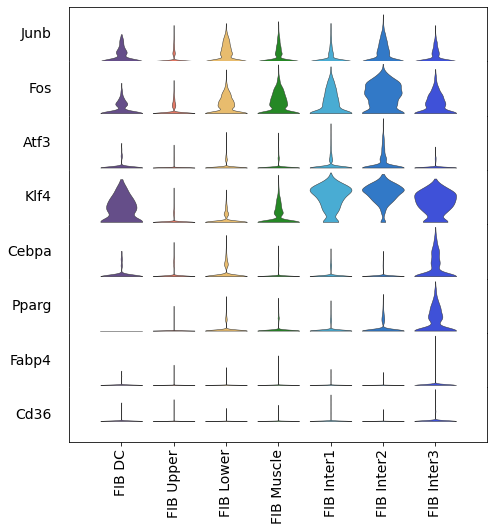

In [115]:
#Generate violin plots with marker genes setting apart the fibroblast subclusters (choose suitable marker gene list)

#Adipogenic markers
marker_genes=['Junb','Fos','Atf3','Klf4','Cebpa','Pparg','Fabp4','Cd36']

cluster_order = ['FIB DC','FIB Upper','FIB Lower','FIB Muscle','FIB Inter1','FIB Inter2','FIB Inter3']
layer = 'normalized'

ncols = 1
mult=3
fig, axes = initialize_subplots(len(marker_genes), ncols = ncols, figsize_multiplier=(7.5,1), gridspec_kw = {'hspace':0.0})

for ix, gene in enumerate(marker_genes):
    ax = axes[ix]
    sc.pl.violin(adata[adata.obs['leiden_grouped_exceptInter'].isin(['FIB DC','FIB Upper','FIB Lower','FIB Muscle','FIB Inter1','FIB Inter2','FIB Inter3'])],keys=gene, groupby = 'leiden_grouped_exceptInter', cut = 0, ax = ax, show = False, stripplot = False, linewidth = 0.5, layer = layer, order = cluster_order)
   
    if ix == len(marker_genes)-1:
        ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, fontsize = 14)
        ax.spines['top'].set_visible(False)
        ax.set_ylim([-1, ax.get_ylim()[1]])
    else:
        ax.set_xticklabels([])
        ax.set_xticks([])
        if ix == 0:
            ax.spines['bottom'].set_visible(False)
            ax.set_ylim([0, ax.get_ylim()[1] + 0.1*ax.get_ylim()[1]])
        else:
            ax.spines['top'].set_visible(False)
            ax.spines['bottom'].set_visible(False)
    
    ax.set_ylabel(gene, fontsize = 14, rotation = 0, labelpad = 10, horizontalalignment='right', verticalalignment='center')   #Activate if labels are desired
    #ax.set_ylabel('')            #Comment out if labels are desired
    ax.yaxis.set_ticks_position('none')      

    ax.set_yticklabels([])                                                  #If no min-max values are desired
    #ax.tick_params(axis = 'y', labelsize = 14)                             #To add min-max values on y axis
    #ax.yaxis.set_major_locator(MaxNLocator(integer = True, nbins = 2))     #To add min-max values on y axis
    #ax.set_yticks([x for x in ax.get_yticks() if x>0][:1])                 #To add min-max values on y axis
    
    ax.set_xlabel('')
    ax.set_xlim(ax.get_xlim()[0]-0.5, ax.get_xlim()[1]+0.5)
    #ax.set_xticklabels([])        #Comment out if labels are desired
    
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Vln_Adipogenesis_WithLabels.pdf'), transparent = True, bbox_inches = 'tight', dpi = 100)

ax = axes[ix]


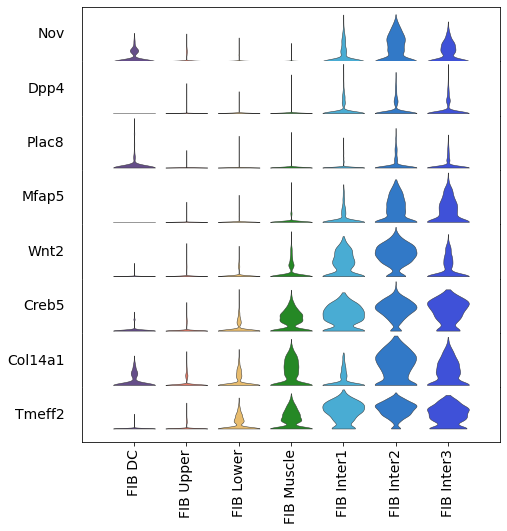

In [116]:
#Generate violin plots with marker genes setting apart the fibroblast subclusters (choose suitable marker gene list)

#Fascia markers
marker_genes=['Nov','Dpp4','Plac8','Mfap5','Wnt2','Creb5','Col14a1','Tmeff2']

cluster_order = ['FIB DC','FIB Upper','FIB Lower','FIB Muscle','FIB Inter1','FIB Inter2','FIB Inter3']
layer = 'normalized'

ncols = 1
mult=3
fig, axes = initialize_subplots(len(marker_genes), ncols = ncols, figsize_multiplier=(7.5,1), gridspec_kw = {'hspace':0.0})

for ix, gene in enumerate(marker_genes):
    ax = axes[ix]
    sc.pl.violin(adata[adata.obs['leiden_grouped_exceptInter'].isin(['FIB DC','FIB Upper','FIB Lower','FIB Muscle','FIB Inter1','FIB Inter2','FIB Inter3'])],keys=gene, groupby = 'leiden_grouped_exceptInter', cut = 0, ax = ax, show = False, stripplot = False, linewidth = 0.5, layer = layer, order = cluster_order)
   
    if ix == len(marker_genes)-1:
        ax.set_xticklabels(ax.get_xticklabels(), rotation = 90, fontsize = 14)
        ax.spines['top'].set_visible(False)
        ax.set_ylim([-1, ax.get_ylim()[1]])
    else:
        ax.set_xticklabels([])
        ax.set_xticks([])
        if ix == 0:
            ax.spines['bottom'].set_visible(False)
            ax.set_ylim([0, ax.get_ylim()[1] + 0.1*ax.get_ylim()[1]])
        else:
            ax.spines['top'].set_visible(False)
            ax.spines['bottom'].set_visible(False)
    
    ax.set_ylabel(gene, fontsize = 14, rotation = 0, labelpad = 10, horizontalalignment='right', verticalalignment='center')   #Activate if labels are desired
    #ax.set_ylabel('')            #Comment out if labels are desired
    ax.yaxis.set_ticks_position('none')      

    ax.set_yticklabels([])                                                  #If no min-max values are desired
    #ax.tick_params(axis = 'y', labelsize = 14)                             #To add min-max values on y axis
    #ax.yaxis.set_major_locator(MaxNLocator(integer = True, nbins = 2))     #To add min-max values on y axis
    #ax.set_yticks([x for x in ax.get_yticks() if x>0][:1])                 #To add min-max values on y axis
    
    ax.set_xlabel('')
    ax.set_xlim(ax.get_xlim()[0]-0.5, ax.get_xlim()[1]+0.5)
    #ax.set_xticklabels([])        #Comment out if labels are desired
    
fig.savefig(os.path.join(path, 'Notebook-Output', 'Fib_Vln_Fascia_WithLabels.pdf'), transparent = True, bbox_inches = 'tight', dpi = 100)